In [45]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import math
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV

In [2]:
# reading the CSV file into pandas dataframe
df = pd.read_csv(r"D:\capstone\Health+Care+Project (1)\Data.csv") 

In [3]:
df.shape

(25000, 24)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   applicant_id                    25000 non-null  int64  
 1   years_of_insurance_with_us      25000 non-null  int64  
 2   regular_checkup_lasy_year       25000 non-null  int64  
 3   adventure_sports                25000 non-null  int64  
 4   Occupation                      25000 non-null  object 
 5   visited_doctor_last_1_year      25000 non-null  int64  
 6   cholesterol_level               25000 non-null  object 
 7   daily_avg_steps                 25000 non-null  int64  
 8   age                             25000 non-null  int64  
 9   heart_decs_history              25000 non-null  int64  
 10  other_major_decs_history        25000 non-null  int64  
 11  Gender                          25000 non-null  object 
 12  avg_glucose_level               

This dataset contains 24 columns and 25000 rows.

In [5]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
applicant_id,25000.0,NaN,NaN,NaN,17499.5,7217.022701,5000.0,11249.75,17499.5,23749.25,29999.0
years_of_insurance_with_us,25000.0,NaN,NaN,NaN,4.08904,2.606612,0.0,2.0,4.0,6.0,8.0
regular_checkup_lasy_year,25000.0,NaN,NaN,NaN,0.77368,1.199449,0.0,0.0,0.0,1.0,5.0
adventure_sports,25000.0,NaN,NaN,NaN,0.08172,0.273943,0.0,0.0,0.0,0.0,1.0
Occupation,25000,3,Student,10169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
visited_doctor_last_1_year,25000.0,NaN,NaN,NaN,3.1042,1.141663,0.0,2.0,3.0,4.0,12.0
cholesterol_level,25000,5,150 to 175,8763,NaN,NaN,NaN,NaN,NaN,NaN,NaN
daily_avg_steps,25000.0,NaN,NaN,NaN,5215.88932,1053.179748,2034.0,4543.0,5089.0,5730.0,11255.0
age,25000.0,NaN,NaN,NaN,44.91832,16.107492,16.0,31.0,45.0,59.0,74.0
heart_decs_history,25000.0,NaN,NaN,NaN,0.05464,0.227281,0.0,0.0,0.0,0.0,1.0


# Data Cleaning

In [6]:
# Null values
df.isnull().sum()

applicant_id                          0
years_of_insurance_with_us            0
regular_checkup_lasy_year             0
adventure_sports                      0
Occupation                            0
visited_doctor_last_1_year            0
cholesterol_level                     0
daily_avg_steps                       0
age                                   0
heart_decs_history                    0
other_major_decs_history              0
Gender                                0
avg_glucose_level                     0
bmi                                 990
smoking_status                        0
Year_last_admitted                11881
Location                              0
weight                                0
covered_by_any_other_company          0
Alcohol                               0
exercise                              0
weight_change_in_last_one_year        0
fat_percentage                        0
insurance_cost                        0
dtype: int64

In [7]:
df.isnull().sum()/df.isnull().sum().sum()*100

applicant_id                       0.00000
years_of_insurance_with_us         0.00000
regular_checkup_lasy_year          0.00000
adventure_sports                   0.00000
Occupation                         0.00000
visited_doctor_last_1_year         0.00000
cholesterol_level                  0.00000
daily_avg_steps                    0.00000
age                                0.00000
heart_decs_history                 0.00000
other_major_decs_history           0.00000
Gender                             0.00000
avg_glucose_level                  0.00000
bmi                                7.69171
smoking_status                     0.00000
Year_last_admitted                92.30829
Location                           0.00000
weight                             0.00000
covered_by_any_other_company       0.00000
Alcohol                            0.00000
exercise                           0.00000
weight_change_in_last_one_year     0.00000
fat_percentage                     0.00000
insurance_c

In [8]:
#Duplicates
df.duplicated().sum()

0

In [9]:
df.select_dtypes(include='object').head()

,Occupation,cholesterol_level,Gender,smoking_status,Location,covered_by_any_other_company,Alcohol,exercise
0,Salried,125 to 150,Male,Unknown,Chennai,N,Rare,Moderate
1,Student,150 to 175,Male,formerly smoked,Jaipur,N,Rare,Moderate
2,Business,200 to 225,Female,formerly smoked,Jaipur,N,Daily,Extreme
3,Business,175 to 200,Female,Unknown,Chennai,Y,Rare,No
4,Student,150 to 175,Male,never smoked,Bangalore,N,No,Extreme


In [ ]:
There are no duplicates in the dataset.

In [10]:
df.head().T # head of the dataset

,0,1,2,3,4
applicant_id,5000,5001,5002,5003,5004
years_of_insurance_with_us,3,0,1,7,3
regular_checkup_lasy_year,1,0,0,4,1
adventure_sports,1,0,0,0,0
Occupation,Salried,Student,Business,Business,Student
visited_doctor_last_1_year,2,4,4,2,2
cholesterol_level,125 to 150,150 to 175,200 to 225,175 to 200,150 to 175
daily_avg_steps,4866,6411,4509,6214,4938
age,28,50,68,51,44
heart_decs_history,1,0,0,0,0


In [3]:
df.drop("applicant_id",inplace=True,axis=1)
# dropping the application_id as it will have no significanc in our model


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  int64  
 1   regular_checkup_lasy_year       25000 non-null  int64  
 2   adventure_sports                25000 non-null  int64  
 3   Occupation                      25000 non-null  object 
 4   visited_doctor_last_1_year      25000 non-null  int64  
 5   cholesterol_level               25000 non-null  object 
 6   daily_avg_steps                 25000 non-null  int64  
 7   age                             25000 non-null  int64  
 8   heart_decs_history              25000 non-null  int64  
 9   other_major_decs_history        25000 non-null  int64  
 10  Gender                          25000 non-null  object 
 11  avg_glucose_level               25000 non-null  int64  
 12  bmi                             

In [83]:
#a)years_of_insurance_with_us-Since how many years customer is taking policy from the same company only


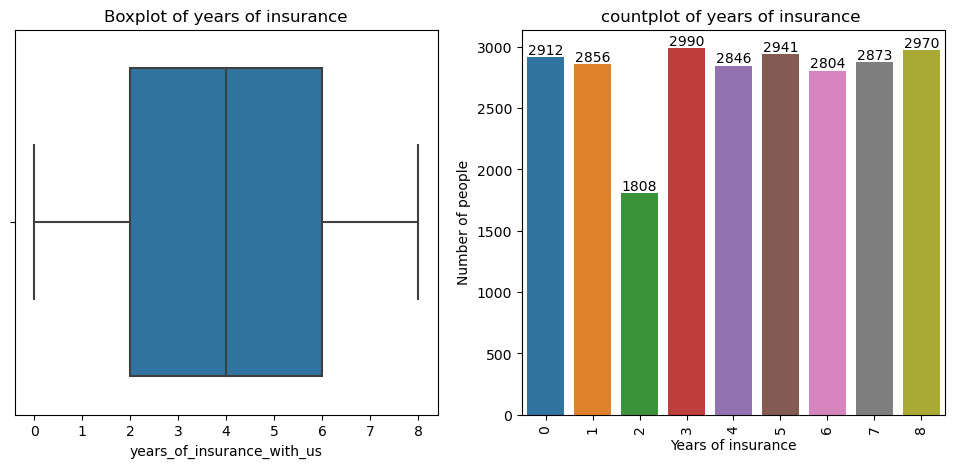

In [13]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='years_of_insurance_with_us', data=df)
plt.title('Boxplot of years of insurance')
plt.subplot(1, 2, 2)
p=sns.countplot(x='years_of_insurance_with_us', data=df)
p.bar_label(p.containers[0])
plt.title('countplot of years of insurance ')
plt.ylabel('Number of people')
plt.xlabel('Years of insurance')
plt.xticks(rotation = 90)
plt.show();

<AxesSubplot:xlabel='years_of_insurance_with_us', ylabel='Count'>

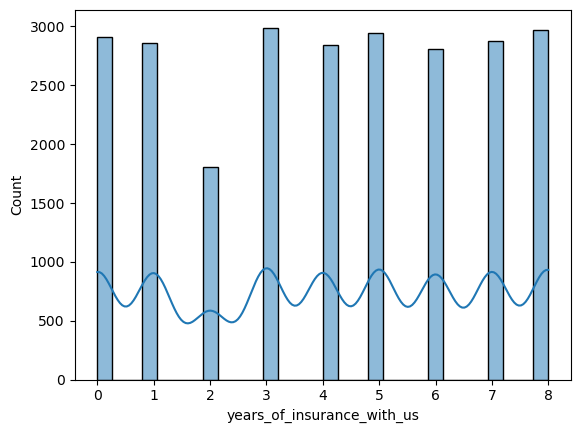

In [14]:
sns.histplot(x='years_of_insurance_with_us', data=df,kde=True)

<AxesSubplot:xlabel='years_of_insurance_with_us', ylabel='insurance_cost'>

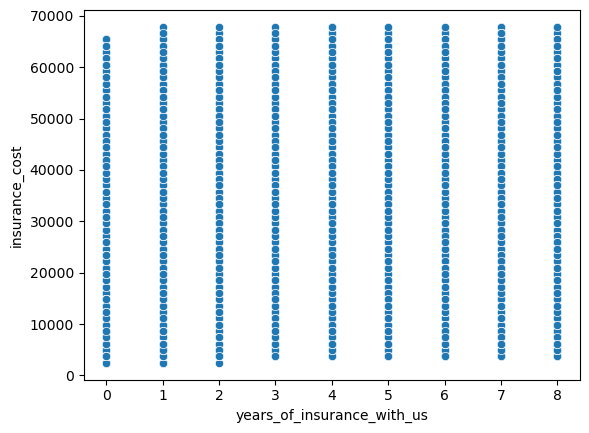

In [15]:
sns.scatterplot(x='years_of_insurance_with_us',y='insurance_cost',data=df)

In [16]:
df['years_of_insurance_with_us'].value_counts(normalize=True)

3    0.11960
8    0.11880
5    0.11764
0    0.11648
7    0.11492
1    0.11424
4    0.11384
6    0.11216
2    0.07232
Name: years_of_insurance_with_us, dtype: float64

In [17]:
df['years_of_insurance_with_us'].describe()

count    25000.000000
mean         4.089040
std          2.606612
min          0.000000
25%          2.000000
50%          4.000000
75%          6.000000
max          8.000000
Name: years_of_insurance_with_us, dtype: float64

In [18]:
from scipy.stats import spearmanr
correlation, pval = spearmanr(df['years_of_insurance_with_us'],df['insurance_cost'])
print(f'correlation={correlation:.6f}, p-value={pval:.6f}')

correlation=0.002927, p-value=0.643564


In [11]:
print(f'correlation={correlation:.6f}, p-value={pval:.6f}')
if pval < 0.05:
    print('At 5% level of significance, the  is significant or dependent')
else:
    print('At 5% level of significance, the  is not significant or independent')

correlation=0.002927, p-value=0.643564
At 5% level of significance, the  is not significant or independent


b)regular_checkup_lasy_year-Number of times customers has done the regular health check up in 
last one year

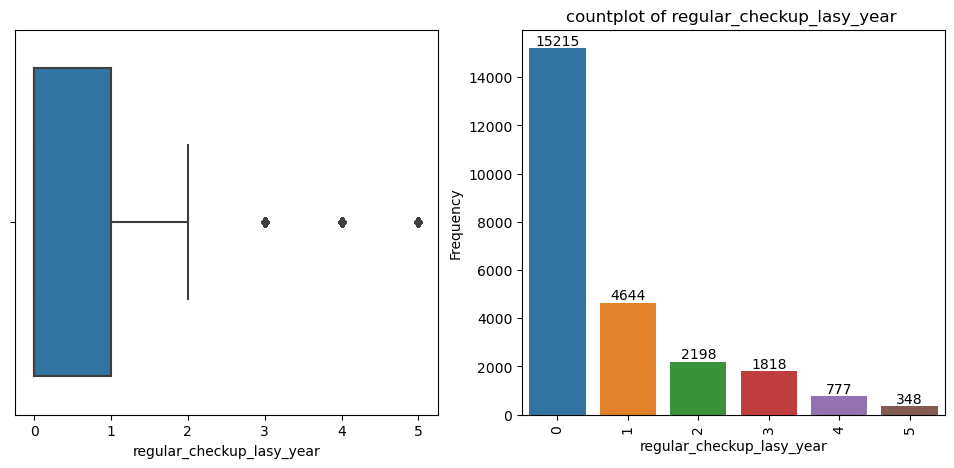

In [19]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='regular_checkup_lasy_year', data=df)
plt.subplot(1, 2, 2)
p=sns.countplot(x='regular_checkup_lasy_year', data=df)
p.bar_label(p.containers[0])
plt.title('countplot of regular_checkup_lasy_year ')
plt.ylabel('Frequency')
plt.xlabel('regular_checkup_lasy_year')
plt.xticks(rotation = 90)
plt.show();

In [20]:
df['regular_checkup_lasy_year'].value_counts(normalize=True)

0    0.60860
1    0.18576
2    0.08792
3    0.07272
4    0.03108
5    0.01392
Name: regular_checkup_lasy_year, dtype: float64

c)adventure_sports-Customer is involved with adventure sports like climbing, diving 
etc

In [21]:
df['adventure_sports'].value_counts()

0    22957
1     2043
Name: adventure_sports, dtype: int64

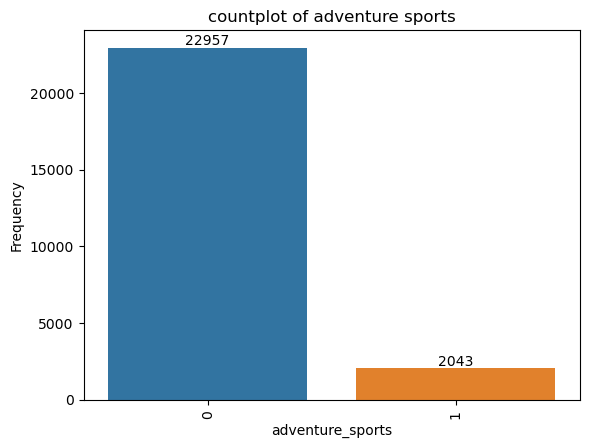

In [22]:
a=sns.countplot(x='adventure_sports', data=df)
a.bar_label(a.containers[0])
plt.title('countplot of adventure sports')
plt.ylabel('Frequency')
plt.xlabel('adventure_sports')
plt.xticks(rotation = 90)
plt.show();

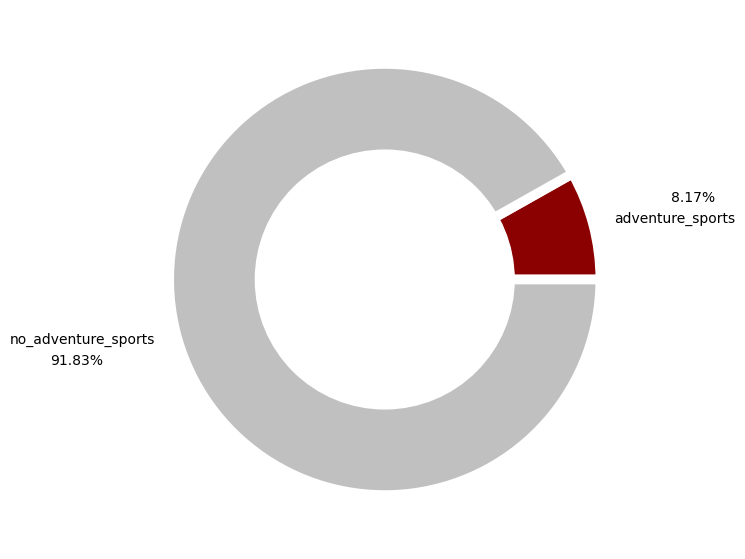

In [23]:
adventure_sports    = df.adventure_sports.value_counts()[1]
no_adventure_sports = df.adventure_sports.value_counts()[0]
names = ['adventure_sports','no_adventure_sports']
size  = [adventure_sports, no_adventure_sports]
# create a pie chart
plt.pie(size, labels=names, colors=['darkred','silver'], 
        autopct='%.2f%%', pctdistance=1.48,
        wedgeprops={'linewidth':7, 'edgecolor':'white'})

# create circle for the center of the plot to make the pie look like a donut
my_circle = plt.Circle((0,0), 0.6, color='white')

# plot the donut chart
fig = plt.gcf()
fig.set_size_inches(8,7)
fig.gca().add_artist(my_circle)
plt.show()

In [ ]:
Occupation

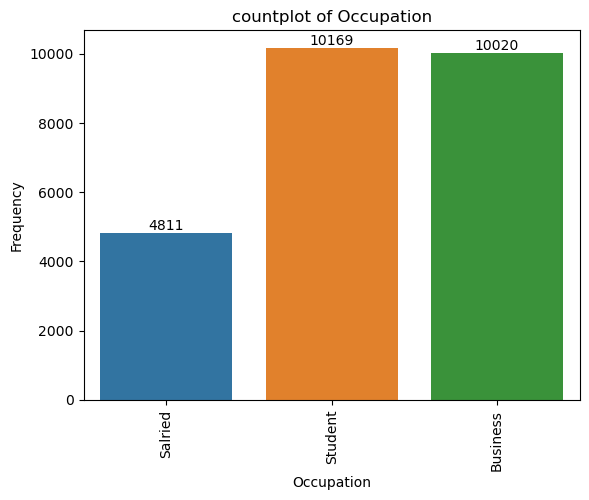

In [25]:
p=sns.countplot(x='Occupation', data=df)
p.bar_label(p.containers[0])
plt.title('countplot of Occupation')
plt.ylabel('Frequency')
plt.xlabel('Occupation')
plt.xticks(rotation = 90)
plt.show();

d)visited_doctor_last_1_year

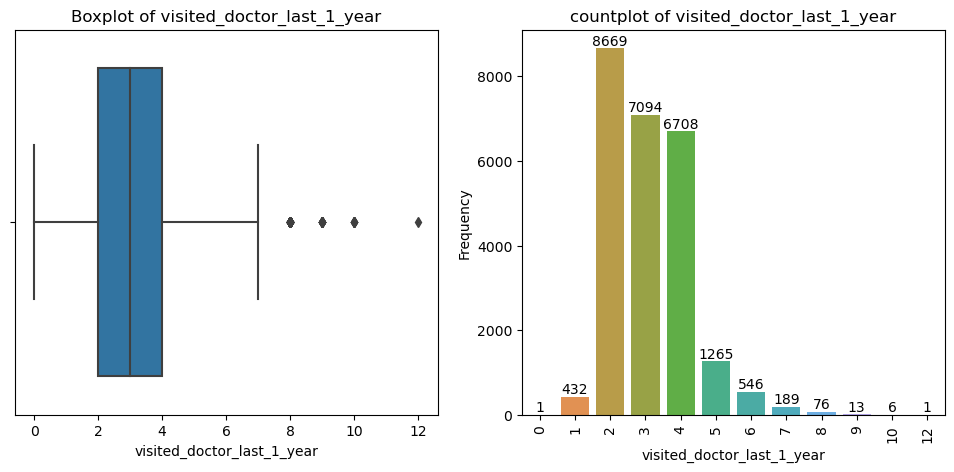

In [28]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='visited_doctor_last_1_year', data=df)
plt.title('Boxplot of visited_doctor_last_1_year')
plt.subplot(1, 2, 2)
plt.title('Boxplot of visited_doctor_last_1_year')
p=sns.countplot(x='visited_doctor_last_1_year', data=df)
p.bar_label(p.containers[0])
plt.title('countplot of visited_doctor_last_1_year')
plt.ylabel('Frequency')
plt.xlabel('visited_doctor_last_1_year')
plt.xticks(rotation = 90)
plt.show();


In [51]:
(df["visited_doctor_last_1_year"] >=2).value_counts()

True     24567
False      433
Name: visited_doctor_last_1_year, dtype: int64

In [48]:
df["visited_doctor_last_1_year"].count()

25000

In [52]:
24567/25000

0.98268

e)cholesterol_level

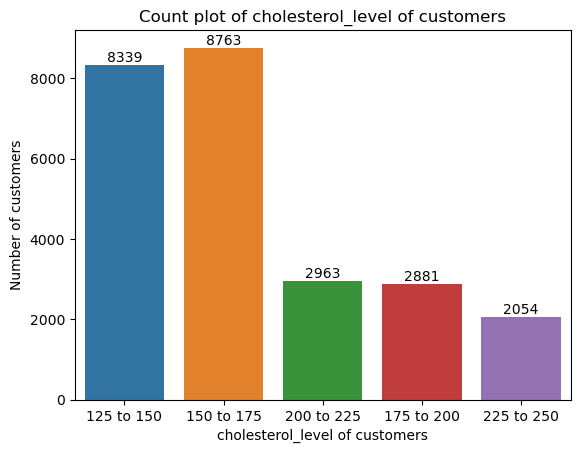

In [55]:
p=sns.countplot(x='cholesterol_level', data=df)
p.bar_label(p.containers[0])
plt.title('Count plot of cholesterol_level of customers')
plt.ylabel('Number of customers')
plt.xlabel('cholesterol_level of customers')
plt.show();


In [ ]:
daily_avg_steps

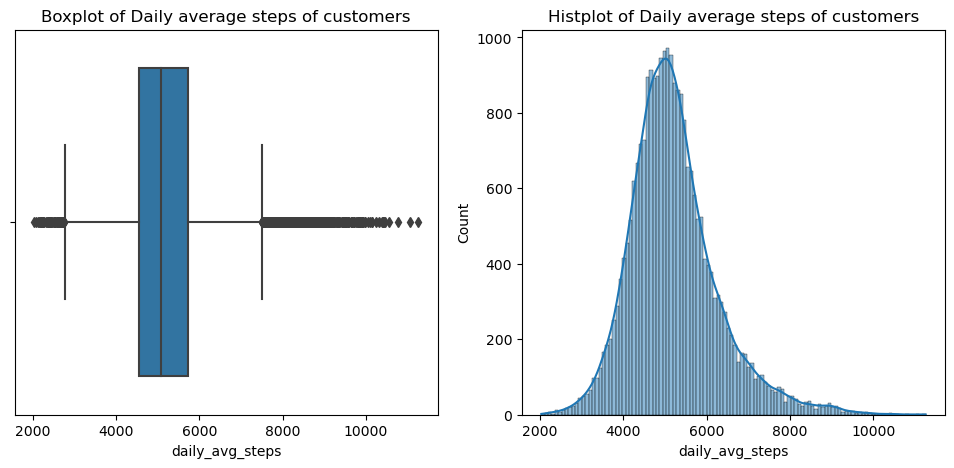

In [57]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='daily_avg_steps', data=df)
plt.title('Boxplot of Daily average steps of customers')
plt.subplot(1, 2, 2)
p=sns.histplot(x='daily_avg_steps', data=df,kde=True)
plt.title('Histplot of Daily average steps of customers')
plt.show();

In [58]:
df['daily_avg_steps'].describe()

count    25000.000000
mean      5215.889320
std       1053.179748
min       2034.000000
25%       4543.000000
50%       5089.000000
75%       5730.000000
max      11255.000000
Name: daily_avg_steps, dtype: float64

In [ ]:
age

Text(0.5, 1.0, 'histplot of age of customers')

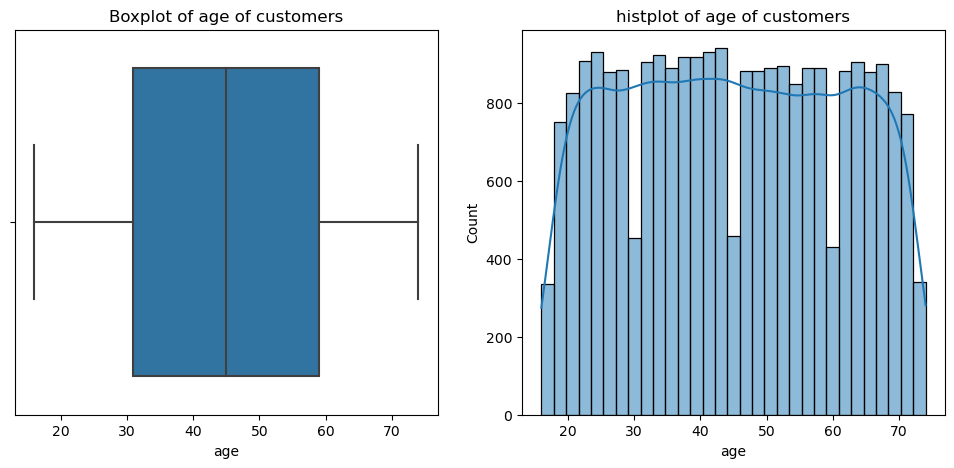

In [59]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='age', data=df)
plt.title('Boxplot of age of customers')
plt.subplot(1, 2, 2)
p=sns.histplot(x='age', data=df,kde=True)
plt.title('histplot of age of customers')

In [60]:
df['age'].describe()

count    25000.000000
mean        44.918320
std         16.107492
min         16.000000
25%         31.000000
50%         45.000000
75%         59.000000
max         74.000000
Name: age, dtype: float64

In [ ]:
heart_decs_history

Text(0.5, 1.0, 'countplot of heart disease history of customers')

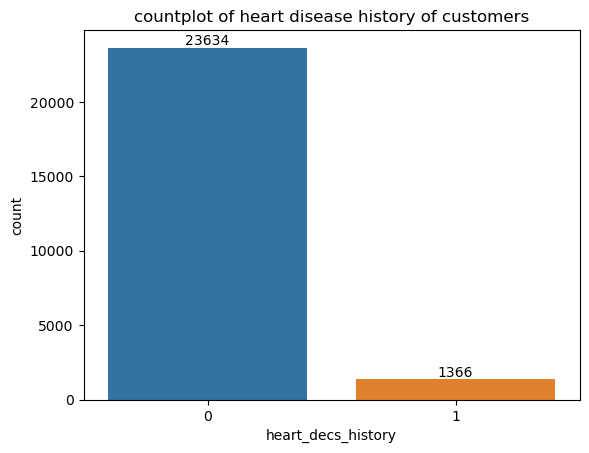

In [61]:
a=sns.countplot(x='heart_decs_history', data=df)
a.bar_label(a.containers[0])
plt.title('countplot of heart disease history of customers')


In [62]:
df['heart_decs_history'].value_counts(normalize=True)


0    0.94536
1    0.05464
Name: heart_decs_history, dtype: float64

In [ ]:
other_major_decs_history

Text(0.5, 1.0, 'countplot of other_major_decs_history')

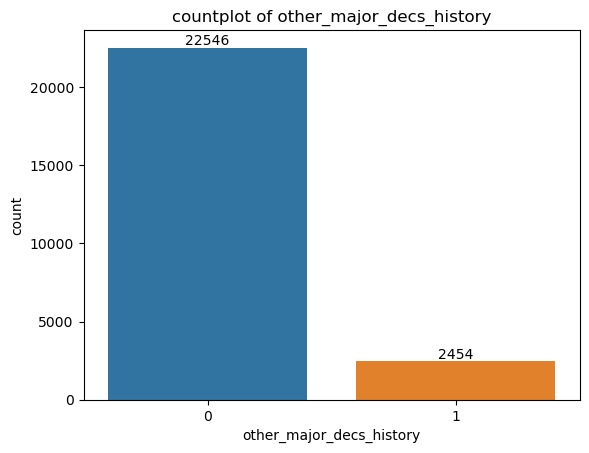

In [63]:
a=sns.countplot(x='other_major_decs_history', data=df)
a.bar_label(a.containers[0])
plt.title('countplot of other_major_decs_history')

In [64]:
df['other_major_decs_history'].value_counts(normalize=True)


0    0.90184
1    0.09816
Name: other_major_decs_history, dtype: float64

In [ ]:
Gender

Text(0, 0.5, 'Number of customers')

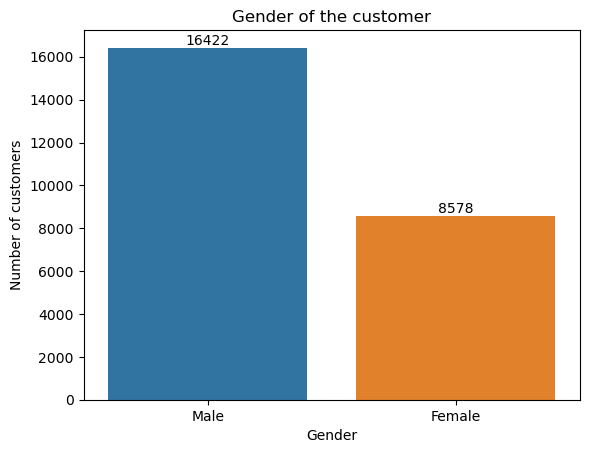

In [65]:
a=sns.countplot(x='Gender', data=df)
a.bar_label(a.containers[0])
plt.title('Gender of the customer')
plt.ylabel("Number of customers")

In [67]:
df['Gender'].value_counts(normalize=True)

Male      0.65688
Female    0.34312
Name: Gender, dtype: float64

In [ ]:
avg_glucose_level

Text(0, 0.5, 'Number of customers')

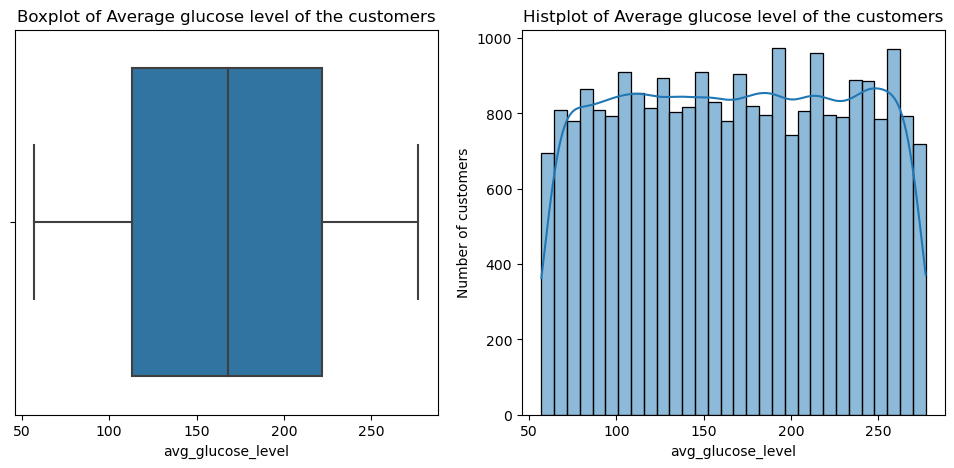

In [69]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='avg_glucose_level', data=df)
plt.title('Boxplot of Average glucose level of the customers')
plt.subplot(1, 2, 2)
p=sns.histplot(x='avg_glucose_level', data=df,kde=True)
plt.title('Histplot of Average glucose level of the customers')
plt.ylabel("Number of customers")


In [74]:
df['avg_glucose_level'].describe()

count    25000.000000
mean       167.530000
std         62.729712
min         57.000000
25%        113.000000
50%        168.000000
75%        222.000000
max        277.000000
Name: avg_glucose_level, dtype: float64

In [ ]:
bmi

Text(0, 0.5, 'Number of customer')

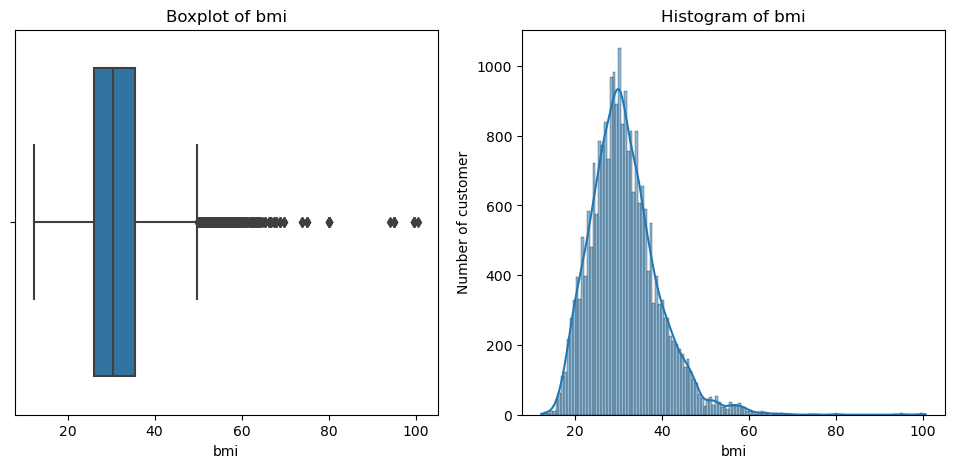

In [72]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='bmi', data=df)
plt.title('Boxplot of bmi')
plt.subplot(1, 2, 2)
p=sns.histplot(x='bmi', data=df,kde=True)
plt.title('Histogram of bmi')
plt.ylabel('Number of customer')

In [73]:
df['bmi'].describe()

count    24010.000000
mean        31.393328
std          7.876535
min         12.300000
25%         26.100000
50%         30.500000
75%         35.600000
max        100.600000
Name: bmi, dtype: float64

In [ ]:
smoking_status

Text(0, 0.5, 'Number of customer')

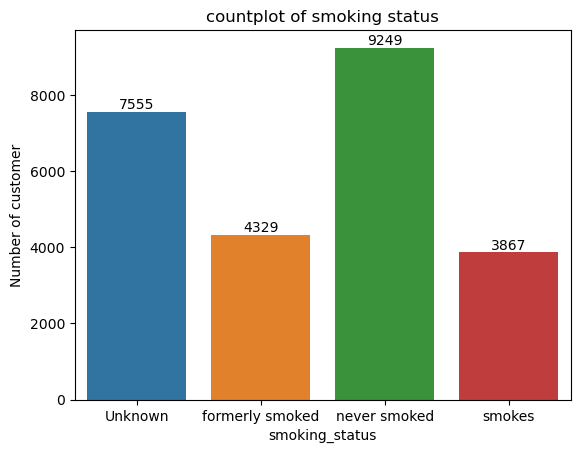

In [75]:
a=sns.countplot(x='smoking_status', data=df)
a.bar_label(a.containers[0])
plt.title('countplot of smoking status')
plt.ylabel('Number of customer')

In [ ]:
Year_last_admitted

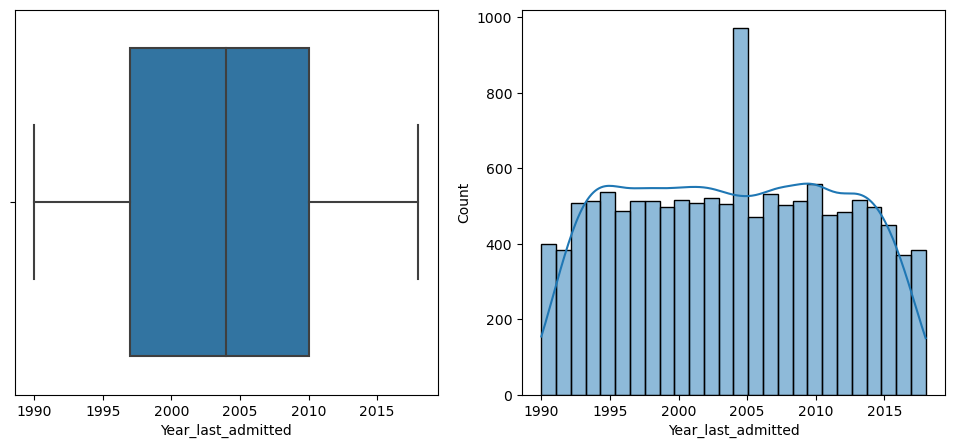

In [33]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='Year_last_admitted', data=df)
plt.subplot(1, 2, 2)
p=sns.histplot(x='Year_last_admitted', data=df,kde=True)

In [87]:
df['Year_last_admitted'].value_counts()

2010.0    557
1995.0    538
2007.0    532
2002.0    520
2000.0    516
2013.0    516
1994.0    514
1998.0    514
1997.0    513
2009.0    512
1993.0    508
2001.0    507
2003.0    504
2008.0    503
1999.0    498
2014.0    496
2005.0    491
1996.0    487
2012.0    483
2004.0    481
2011.0    475
2006.0    472
2015.0    449
1992.0    382
2016.0    370
1991.0    276
2017.0    253
2018.0    130
1990.0    122
Name: Year_last_admitted, dtype: int64

Text(0, 0.5, 'Number of customer')

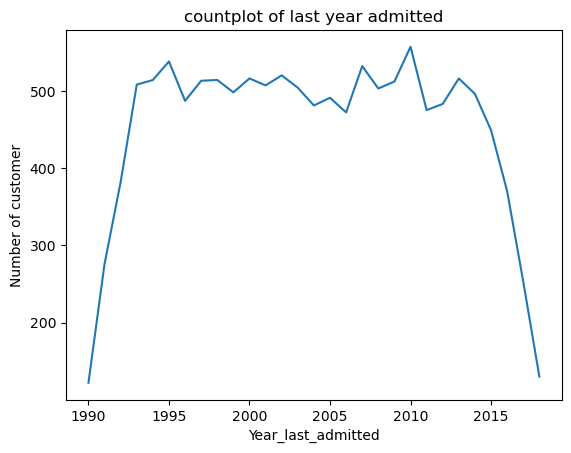

In [86]:
a=sns.lineplot(
    data=df.groupby(['Year_last_admitted']).size().reset_index(name='count'), 
    x='Year_last_admitted', y='count')
plt.title('countplot of last year admitted')
plt.ylabel('Number of customer')

In [ ]:
Location

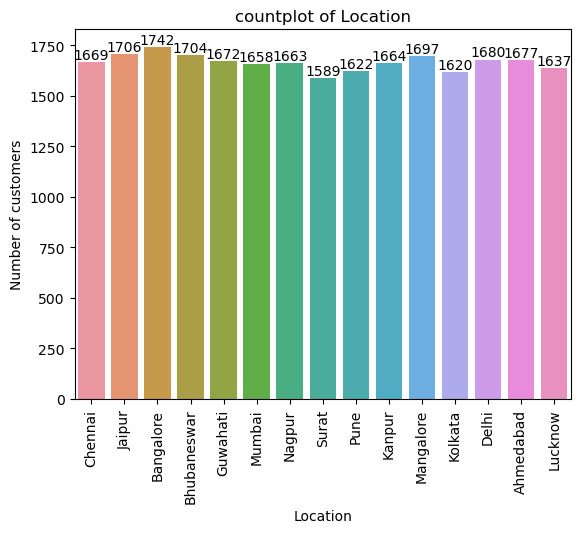

In [88]:
a=sns.countplot(x='Location', data=df)
a.bar_label(a.containers[0])
plt.title('countplot of Location')
plt.ylabel('Number of customers')
plt.xticks(rotation = 90)
plt.show();

In [ ]:
weight

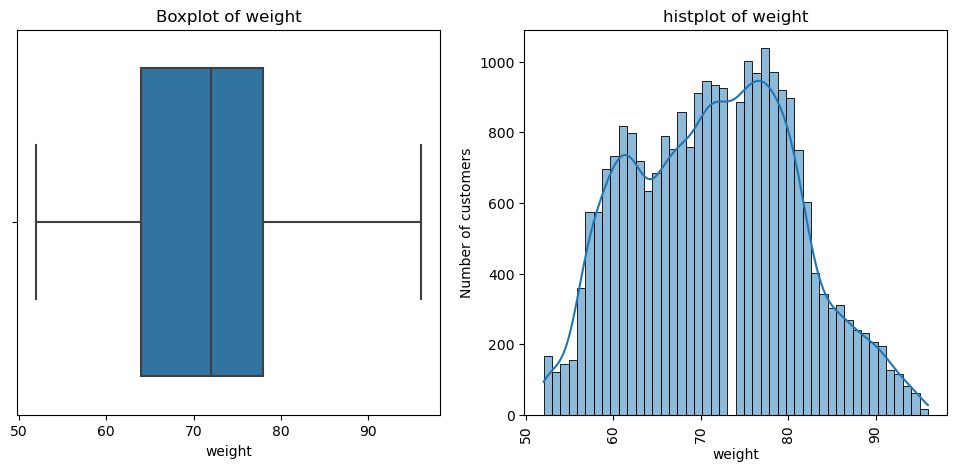

In [91]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='weight', data=df)
plt.title('Boxplot of weight')
plt.subplot(1, 2, 2)
p=sns.histplot(x='weight', data=df,kde=True)
plt.title('histplot of weight')
plt.ylabel('Number of customers')
plt.xticks(rotation = 90)
plt.show()


In [92]:
df['weight'].describe()

count    25000.000000
mean        71.610480
std          9.325183
min         52.000000
25%         64.000000
50%         72.000000
75%         78.000000
max         96.000000
Name: weight, dtype: float64

In [ ]:
covered_by_any_other_company

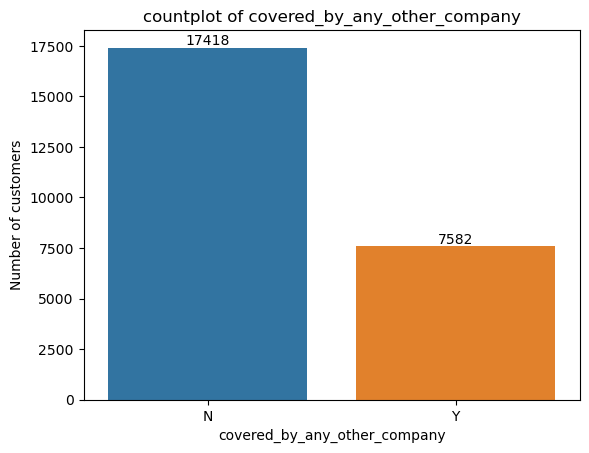

In [93]:
a=sns.countplot(x='covered_by_any_other_company', data=df)
a.bar_label(a.containers[0])
plt.title('countplot of covered_by_any_other_company')
plt.ylabel('Number of customers')
plt.show()

In [ ]:
Alcohol

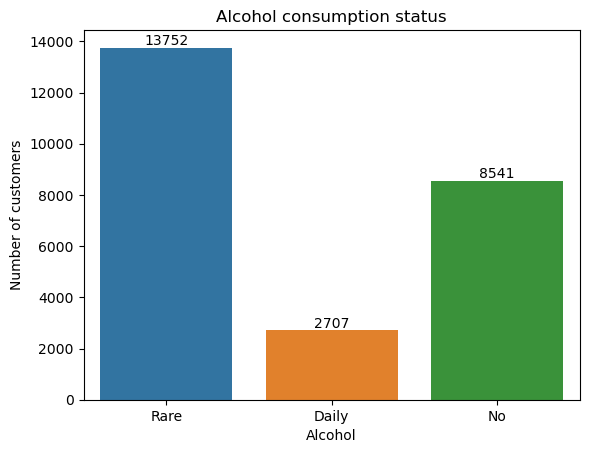

In [14]:
a=sns.countplot(x='Alcohol', data=df)
a.bar_label(a.containers[0])
plt.title('Alcohol consumption status')
plt.ylabel('Number of customers')
plt.show()

In [ ]:
exercise

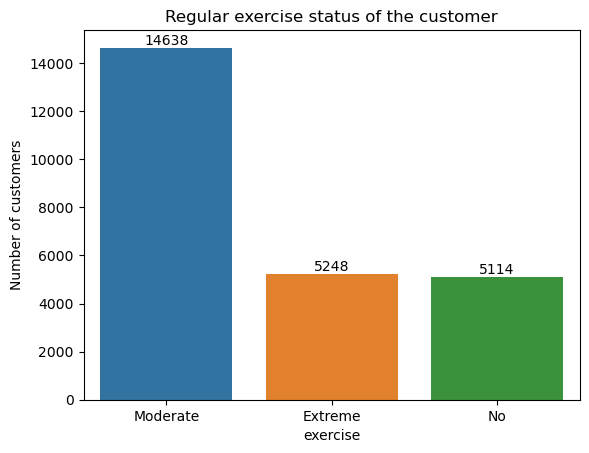

In [13]:
a=sns.countplot(x='exercise', data=df)
a.bar_label(a.containers[0])
plt.title('Regular exercise status of the customer')
plt.ylabel('Number of customers')
plt.show()

weight_change_in_last_one_year-How much variation has been seen in the weight of the customer in last year

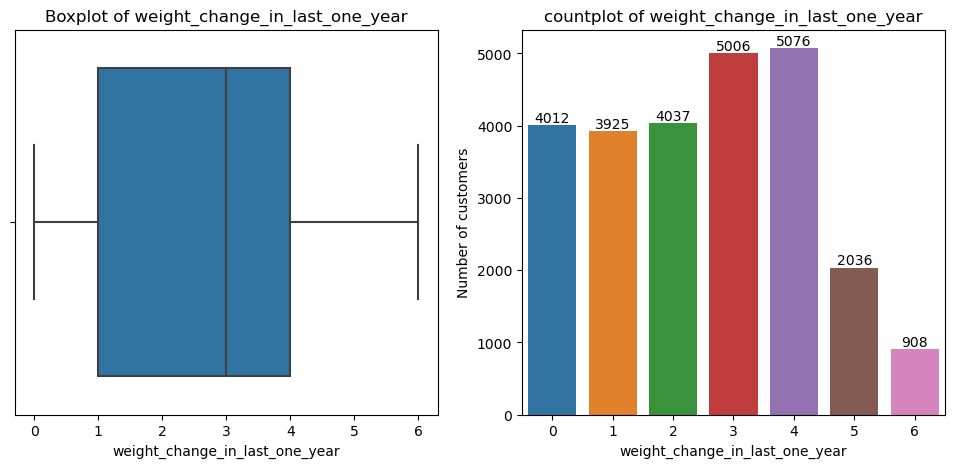

In [101]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='weight_change_in_last_one_year', data=df)
plt.title('Boxplot of weight_change_in_last_one_year')
plt.subplot(1, 2, 2)
a=sns.countplot(x='weight_change_in_last_one_year', data=df)
a.bar_label(a.containers[0])
plt.title('countplot of weight_change_in_last_one_year')
plt.ylabel('Number of customers')
plt.show()

In [102]:
df['weight_change_in_last_one_year'].describe()

count    25000.000000
mean         2.517960
std          1.690335
min          0.000000
25%          1.000000
50%          3.000000
75%          4.000000
max          6.000000
Name: weight_change_in_last_one_year, dtype: float64

In [ ]:
fat_percentage

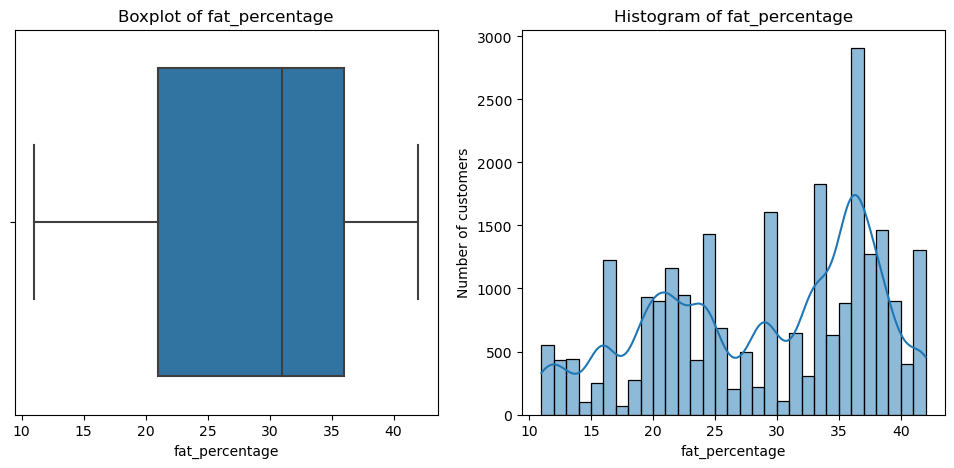

In [99]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='fat_percentage', data=df)
plt.title('Boxplot of fat_percentage')
plt.subplot(1, 2, 2)
p=sns.histplot(x='fat_percentage', data=df,kde=True)
plt.title('Histogram of fat_percentage')
plt.ylabel('Number of customers')
plt.show()

In [100]:
df['fat_percentage'].describe()

count    25000.000000
mean        28.812280
std          8.632382
min         11.000000
25%         21.000000
50%         31.000000
75%         36.000000
max         42.000000
Name: fat_percentage, dtype: float64

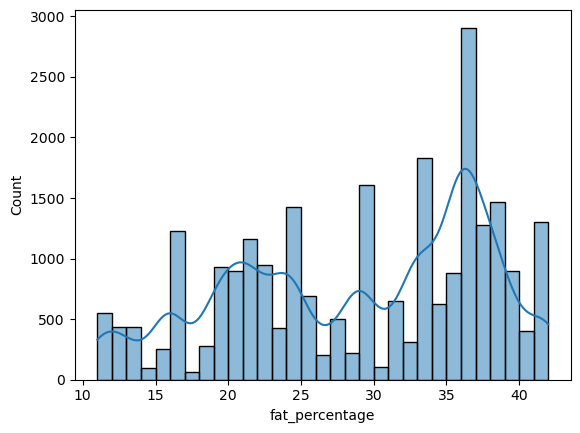

In [48]:
p=sns.histplot(x='fat_percentage', data=df,kde=True)
plt.title('histogram of fat_percentage')
plt.ylabel('Number of customers')
plt.show()

In [ ]:
insurance_cost

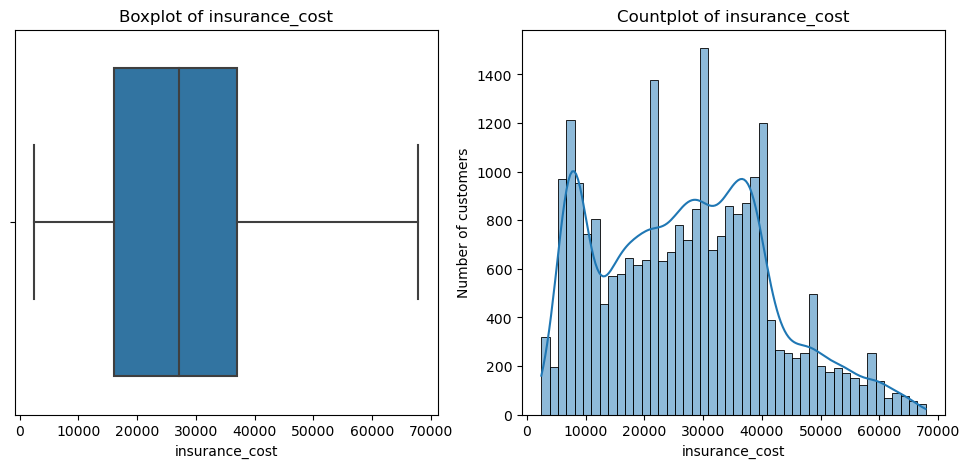

In [96]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x='insurance_cost', data=df)
plt.title('Boxplot of insurance_cost')
plt.subplot(1, 2, 2)
p=sns.histplot(x='insurance_cost', data=df,kde=True)
plt.title('Countplot of insurance_cost')
plt.ylabel('Number of customers')
plt.show()

In [97]:
df['insurance_cost'].describe()

count    25000.000000
mean     27147.407680
std      14323.691832
min       2468.000000
25%      16042.000000
50%      27148.000000
75%      37020.000000
max      67870.000000
Name: insurance_cost, dtype: float64

Bi-Variate

In [55]:
def bmi_to_cat(bmi: float) -> str:
    if bmi < 18.5: return 'Underweight'
    elif 18.5 <= bmi < 25: return 'Normal Weight'
    elif 25 <= bmi < 30: return 'Overweight'
    elif 30 <= bmi < 35: return 'Obese'
    elif 35 <= bmi < 40: return 'Severely Obese'
    elif 40 <= bmi: return 'Morbidly Obese'
    
df.insert(3, 'bmi_cat', df['bmi'].apply(bmi_to_cat))
df.head()

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,bmi_cat,Occupation,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,...,smoking_status,Year_last_admitted,Location,weight,covered_by_any_other_company,Alcohol,exercise,weight_change_in_last_one_year,fat_percentage,insurance_cost
0,3,1,1,Obese,Salried,2,125 to 150,4866,28,1,...,Unknown,NaT,Chennai,67,N,Rare,Moderate,1,25,20978
1,0,0,0,Obese,Student,4,150 to 175,6411,50,0,...,formerly smoked,NaT,Jaipur,58,N,Rare,Moderate,3,27,6170
2,1,0,0,Morbidly Obese,Business,4,200 to 225,4509,68,0,...,formerly smoked,NaT,Jaipur,73,N,Daily,Extreme,0,32,28382
3,7,4,0,Normal Weight,Business,2,175 to 200,6214,51,0,...,Unknown,NaT,Chennai,71,Y,Rare,No,3,37,27148
4,3,1,0,Overweight,Student,2,150 to 175,4938,44,0,...,never smoked,2004-01-01,Bangalore,74,N,No,Extreme,0,34,29616


In [56]:
fig = px.scatter(df, x="bmi", y="age", color="bmi_cat")
fig.show()

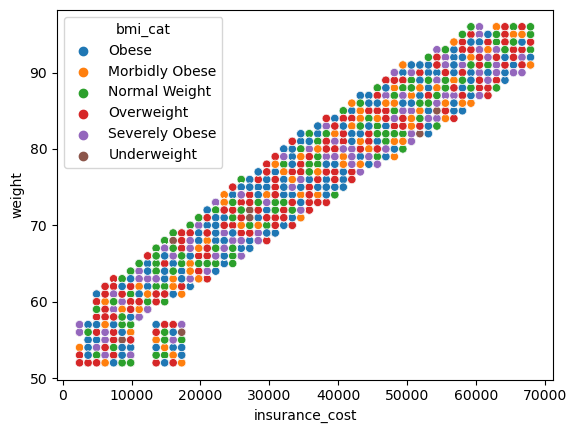

In [79]:
fig = sns.scatterplot(data=df, x="insurance_cost", y="weight", hue='bmi_cat')

In [59]:
fig = px.strip(df, x="Location", y="insurance_cost")
fig.show()z

<AxesSubplot:xlabel='insurance_cost', ylabel='Count'>

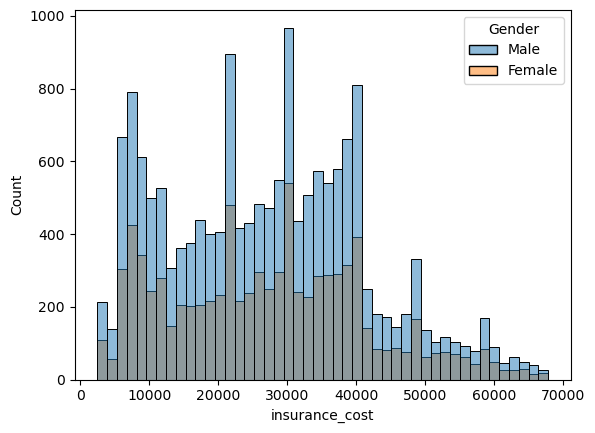

In [82]:
sns.histplot(x='insurance_cost', data=df, hue='Gender')


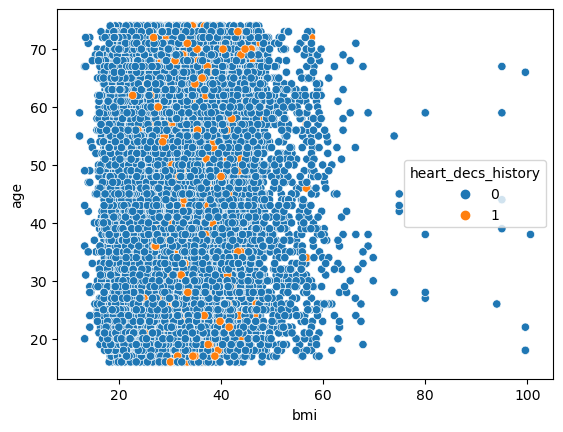

In [43]:
fig = sns.scatterplot(data=df, x="bmi", y="age", hue='heart_decs_history')

<AxesSubplot:xlabel='bmi', ylabel='age'>

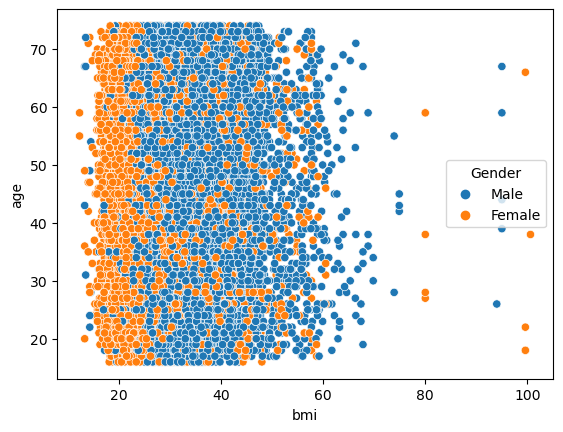

In [46]:
sns.scatterplot(data=df, x="bmi", y="age", hue='Gender')


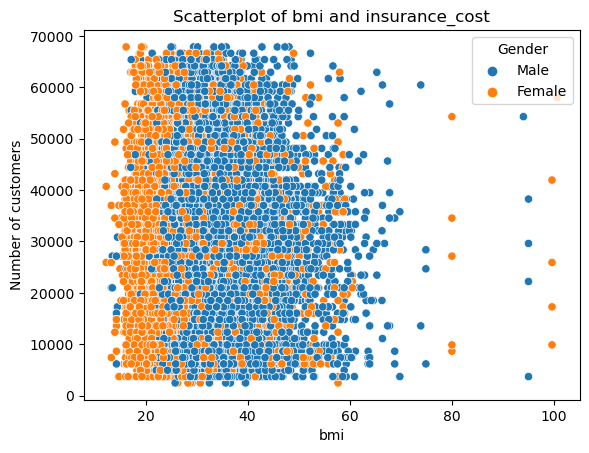

In [50]:
sns.scatterplot(data=df, x="bmi", y="insurance_cost", hue='Gender')
plt.title('Scatterplot of bmi and insurance_cost')
plt.ylabel('Number of customers')
plt.show()

In [4]:
import plotly.express as px


In [54]:
fig = px.scatter(df, x='bmi', y='insurance_cost', color='smoking_status')
fig.show()

<AxesSubplot:xlabel='Alcohol', ylabel='insurance_cost'>

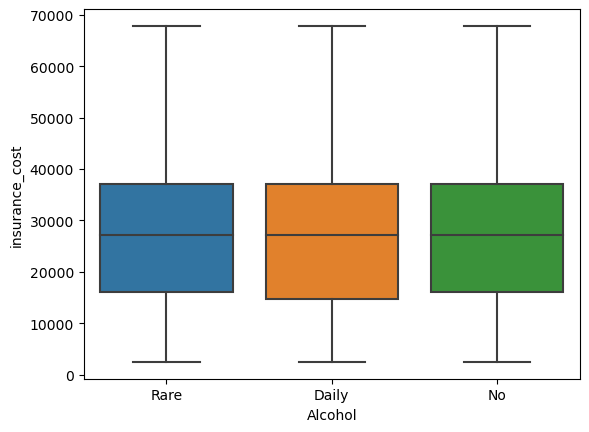

In [28]:
sns.boxplot(y='insurance_cost', data=df, x='Alcohol')

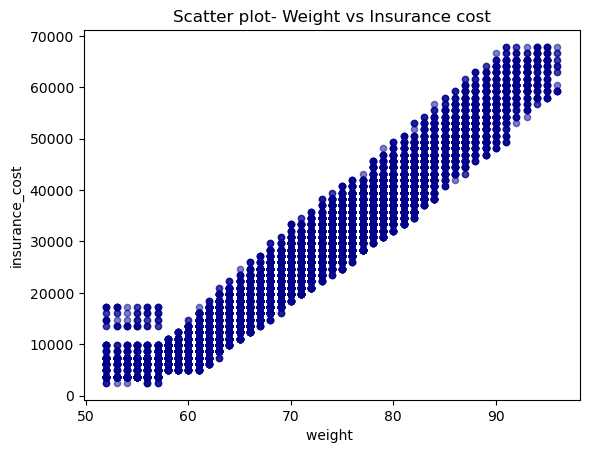

In [36]:
## Let's study the review_scores_rating with price

df.plot(kind='scatter', x='weight', y='insurance_cost',alpha = 0.5,color = 'darkblue')
plt.xlabel('weight ')              # l abel = name of label
plt.ylabel('insurance_cost')
plt.title('Scatter plot- Weight vs Insurance cost')            # title = title of plot
plt.show()

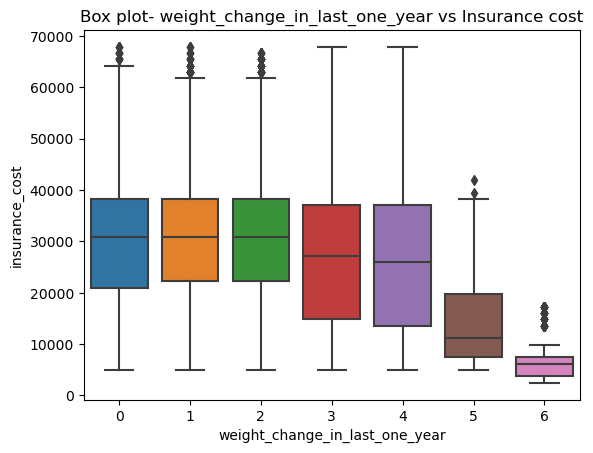

In [76]:
sns.boxplot(data=df, x='weight_change_in_last_one_year', y='insurance_cost')
plt.xlabel('weight_change_in_last_one_year')              # l abel = name of label
plt.ylabel('insurance_cost')
plt.title('Box plot- weight_change_in_last_one_year vs Insurance cost')            # title = title of plot
plt.show()


In [64]:
df['weight'].head()

0    67
1    58
2    73
3    71
4    74
Name: weight, dtype: int64

AttributeError: 'PathCollection' object has no property 'hue'

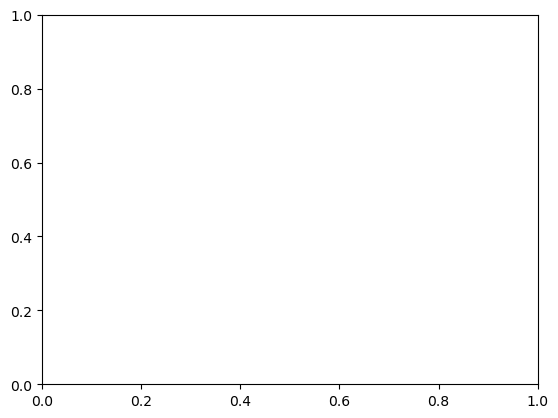

In [60]:
df.plot(kind='scatter', x='weight', y='insurance_cost',hue='smoking_status')

In [ ]:
sns.boxplot(y="smoker", x="insurance_cost", data =  df[(df.Gender == 1)] , orient="h", palette = 'magma')

<AxesSubplot:xlabel='insurance_cost', ylabel='Gender'>

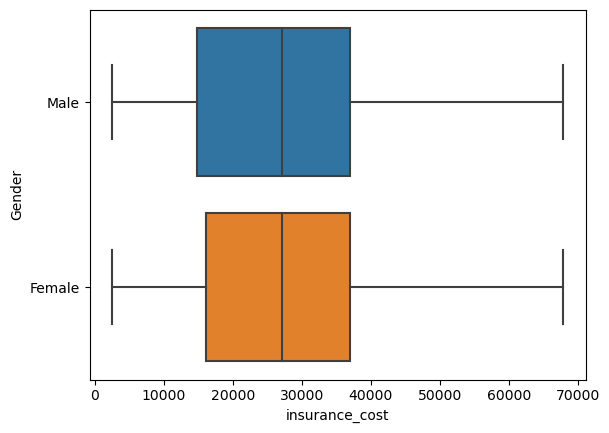

In [86]:
sns.boxplot(x='insurance_cost',y='Gender',data=df)

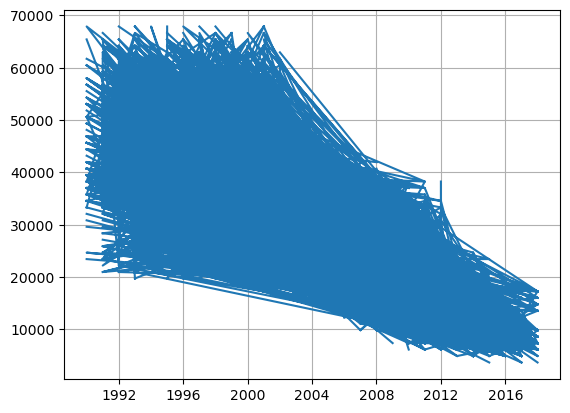

In [85]:
plt.plot(df['Year_last_admitted'],df['insurance_cost']);
plt.grid()

In [ ]:
var = 'OverallQual'
data = pd.concat([df_train['SalePrice'], df_train[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="SalePrice", data=data)
fig.axis(ymin=0, ymax=800000);

In [ ]:
fig, ax = plt.subplots()

ax.hist(df[df["Survived"]==1]["Age"], bins=15, alpha=0.5, color="blue", label="survived")
ax.hist(df[df["Survived"]==0]["Age"], bins=15, alpha=0.5, color="green", label="did not survive")

ax.set_xlabel("Age")
ax.set_ylabel("Count of passengers")

fig.suptitle("Age vs. Survival for Titanic Passengers")

ax.legend();

In [ ]:
Take hue and plot multiple plot

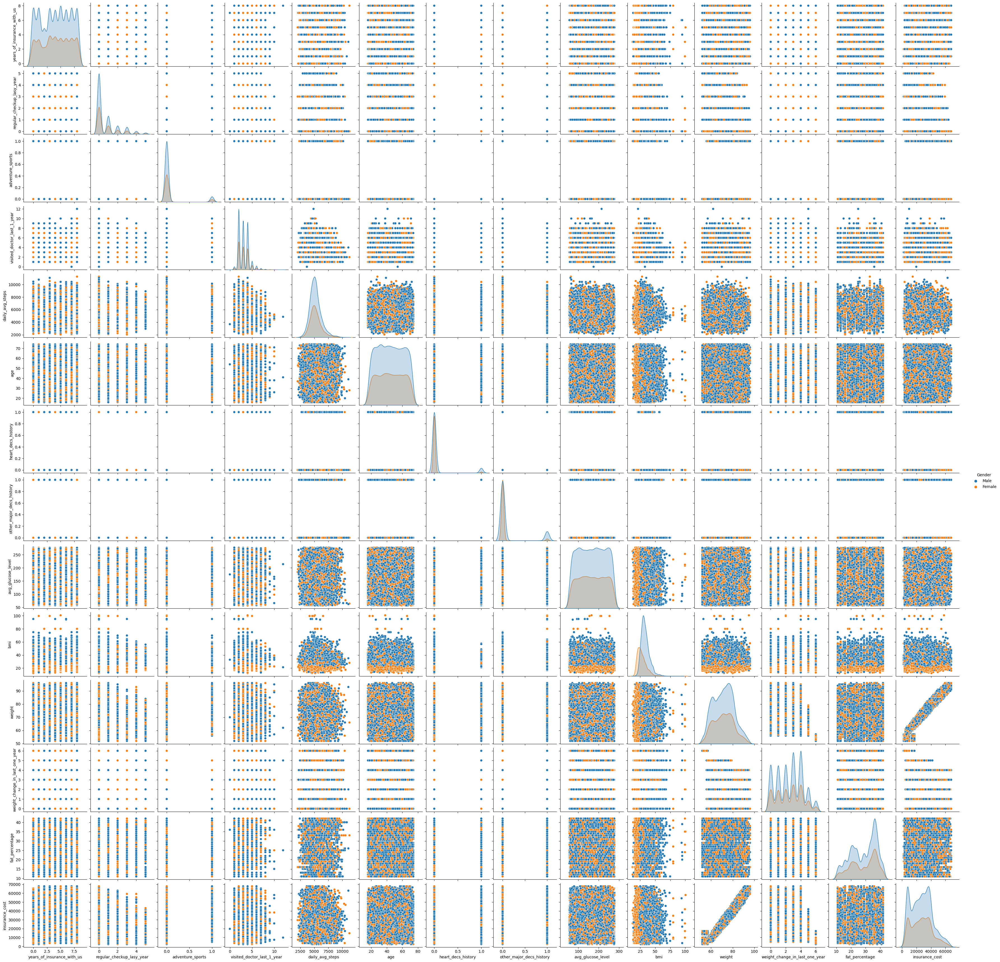

In [84]:
sns.pairplot(df, hue='Gender')

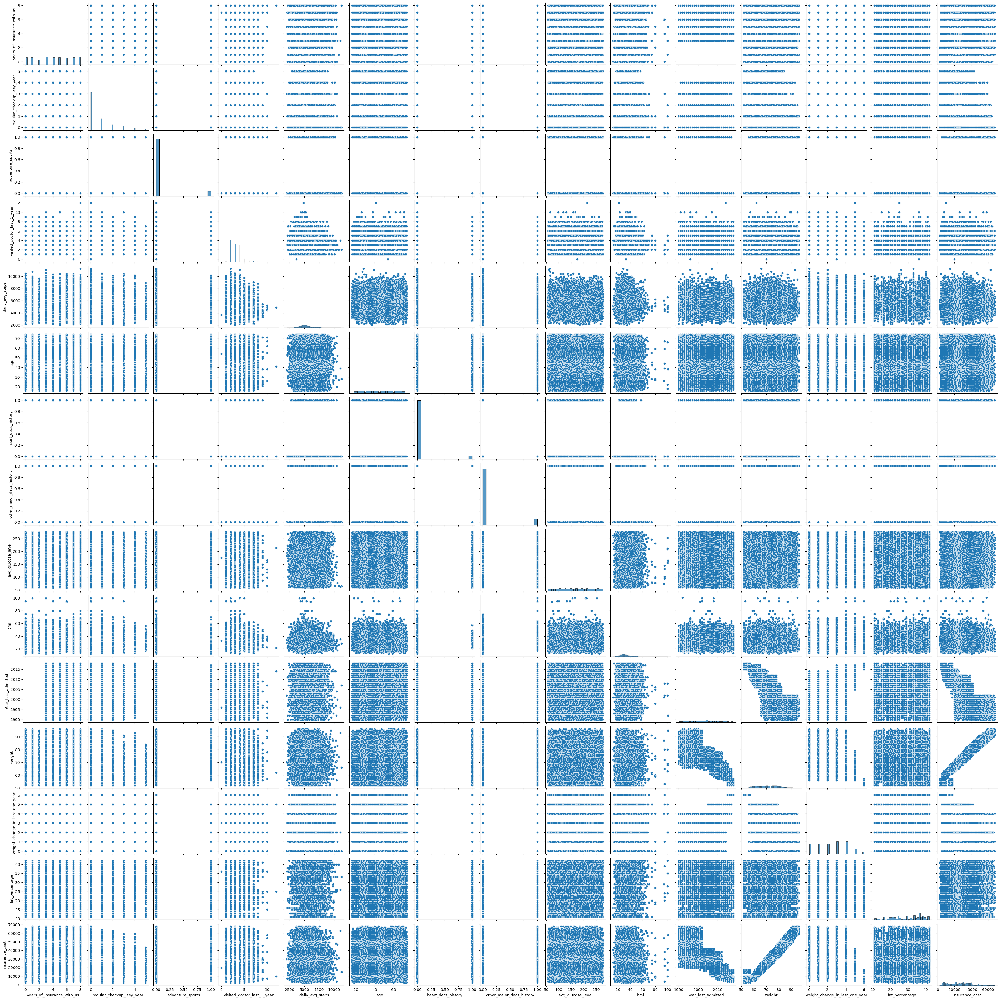

In [55]:
sns.pairplot(df)


In [4]:
#Year_last_admitted- This variable is in float datatype so we convert it to date time format
df["Year_last_admitted"] = pd.to_datetime(df["Year_last_admitted"], format='%Y')

In [4]:
df.drop(['bmi_cat'],axis=1,inplace=True)

KeyError: "['bmi_cat'] not found in axis"

In [89]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   years_of_insurance_with_us      25000 non-null  int64         
 1   regular_checkup_lasy_year       25000 non-null  int64         
 2   adventure_sports                25000 non-null  int64         
 3   Occupation                      25000 non-null  object        
 4   visited_doctor_last_1_year      25000 non-null  int64         
 5   cholesterol_level               25000 non-null  object        
 6   daily_avg_steps                 25000 non-null  int64         
 7   age                             25000 non-null  int64         
 8   heart_decs_history              25000 non-null  int64         
 9   other_major_decs_history        25000 non-null  int64         
 10  Gender                          25000 non-null  object        
 11  av

In [9]:
df["Year_last_admitted"].dtype

dtype('<M8[ns]')

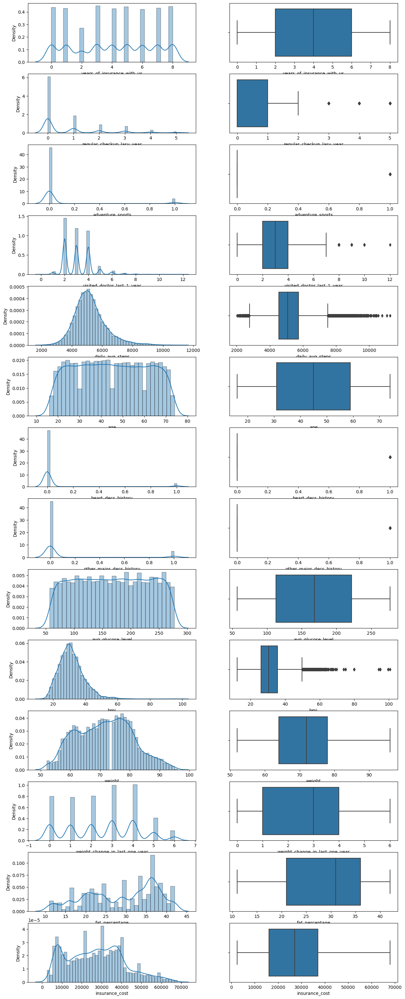

In [14]:
df_1 = df.select_dtypes(['int64','float64'])
a = len(df_1.columns) # number of rows
b = 2 # number of columns
c = 1
fig = plt.figure(figsize=(15,40))
for i in df_1.columns:
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.distplot(df_1[i], hist_kws= dict(ec = 'black'))
    c = c + 1
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.boxplot(x = df_1[i])
    c = c + 1

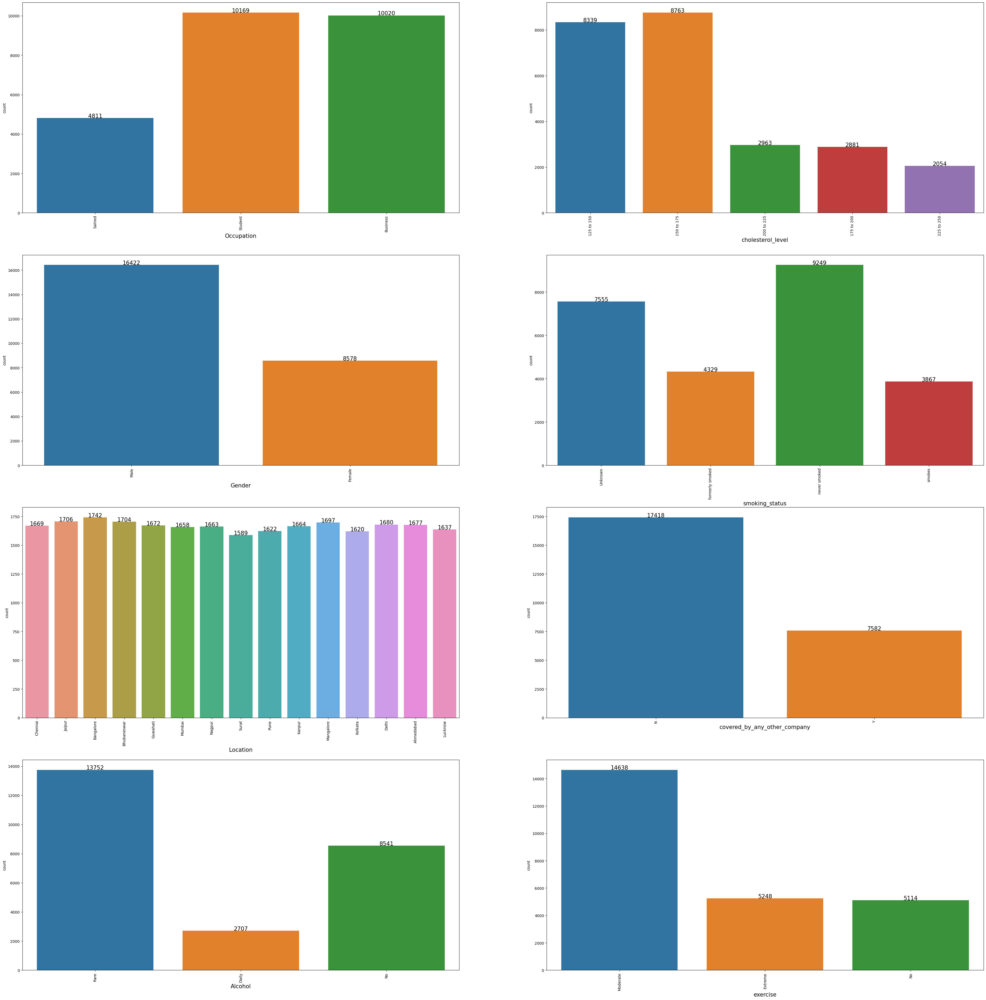

In [20]:
df_2 = df.select_dtypes(['object','category'])
a = len(df_2.columns) # number of rows
b = 2 # number of columns
c = 1 # initialize plot counter
fig = plt.figure(figsize=(a*5.8,a*12))
for i in df_2.columns:
    plt.subplot(a, b, c)
    plt.xlabel(i,fontsize =15)
    plt.xticks(rotation=90)
    ax1 = sns.countplot(df_2[i])
    c = c + 1
    for p in ax1.patches:
        ax1.annotate(format(p.get_height()), (p.get_x() + p.get_width() / 2,
        p.get_height()), ha='center', va='center',
        xytext=(0, 5),
        textcoords='offset points',fontsize = 15)

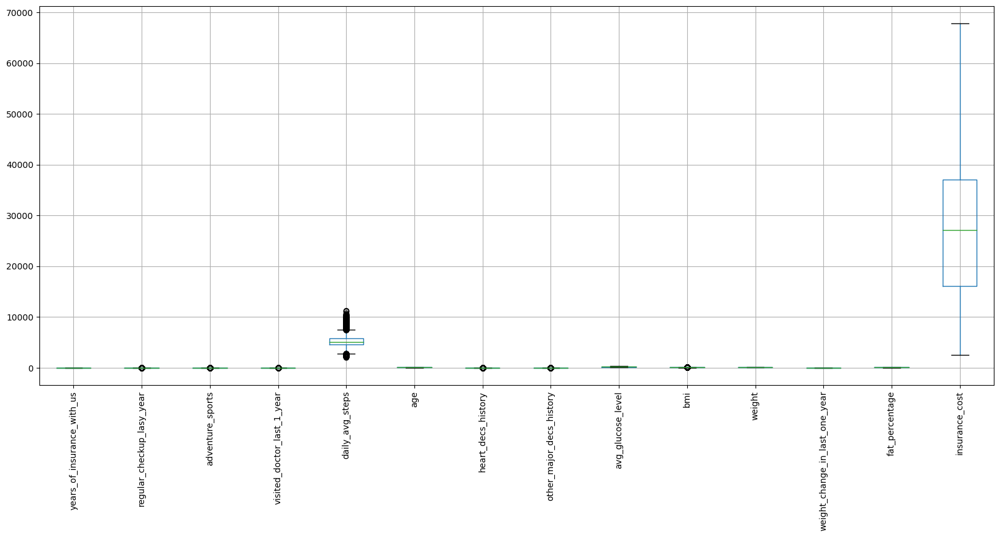

In [16]:
df_1 = df.select_dtypes(['int64','float64'])
a = len(df_1.columns) # number of rows
b = 2 # number of columns
c = 1 # initialize plot counter
fig = plt.figure(figsize=(15,40))
for i in df_1.columns:
    plt.subplot(a, b, c)
    plt.xlabel(i)
    sns.boxplot(x = df1['Taken_product'],y = df_1[i])
    c = c + 1

In [ ]:
#Treating null values

In [90]:
df.isnull().sum()

years_of_insurance_with_us            0
regular_checkup_lasy_year             0
adventure_sports                      0
Occupation                            0
visited_doctor_last_1_year            0
cholesterol_level                     0
daily_avg_steps                       0
age                                   0
heart_decs_history                    0
other_major_decs_history              0
Gender                                0
avg_glucose_level                     0
bmi                                 990
smoking_status                        0
Year_last_admitted                11881
Location                              0
weight                                0
covered_by_any_other_company          0
Alcohol                               0
exercise                              0
weight_change_in_last_one_year        0
fat_percentage                        0
insurance_cost                        0
dtype: int64

In [91]:
11881/25000

0.47524

In [ ]:
df['bmi']

In [6]:
df.duplicated().sum()

0

In [4]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values = np.nan, strategy = 'median',verbose=0)
imputer = imputer.fit(df[['bmi']])

In [5]:
df['bmi'] = imputer.transform(df[['bmi']])

In [6]:
df.isnull().sum()

years_of_insurance_with_us            0
regular_checkup_lasy_year             0
adventure_sports                      0
Occupation                            0
visited_doctor_last_1_year            0
cholesterol_level                     0
daily_avg_steps                       0
age                                   0
heart_decs_history                    0
other_major_decs_history              0
Gender                                0
avg_glucose_level                     0
bmi                                   0
smoking_status                        0
Year_last_admitted                11881
Location                              0
weight                                0
covered_by_any_other_company          0
Alcohol                               0
exercise                              0
weight_change_in_last_one_year        0
fat_percentage                        0
insurance_cost                        0
dtype: int64

In [7]:
df.drop("Year_last_admitted",axis=1,inplace=True)

In [9]:
df.isnull().sum()

years_of_insurance_with_us        0
regular_checkup_lasy_year         0
adventure_sports                  0
Occupation                        0
visited_doctor_last_1_year        0
cholesterol_level                 0
daily_avg_steps                   0
age                               0
heart_decs_history                0
other_major_decs_history          0
Gender                            0
avg_glucose_level                 0
bmi                               0
smoking_status                    0
Location                          0
weight                            0
covered_by_any_other_company      0
Alcohol                           0
exercise                          0
weight_change_in_last_one_year    0
fat_percentage                    0
insurance_cost                    0
dtype: int64

**Check for Outliers**

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  int64  
 1   regular_checkup_lasy_year       25000 non-null  int64  
 2   adventure_sports                25000 non-null  int64  
 3   Occupation                      25000 non-null  object 
 4   visited_doctor_last_1_year      25000 non-null  int64  
 5   cholesterol_level               25000 non-null  object 
 6   daily_avg_steps                 25000 non-null  int64  
 7   age                             25000 non-null  int64  
 8   heart_decs_history              25000 non-null  int64  
 9   other_major_decs_history        25000 non-null  int64  
 10  Gender                          25000 non-null  object 
 11  avg_glucose_level               25000 non-null  int64  
 12  bmi                             

Shape before Outliers Treatment (25000, 22)


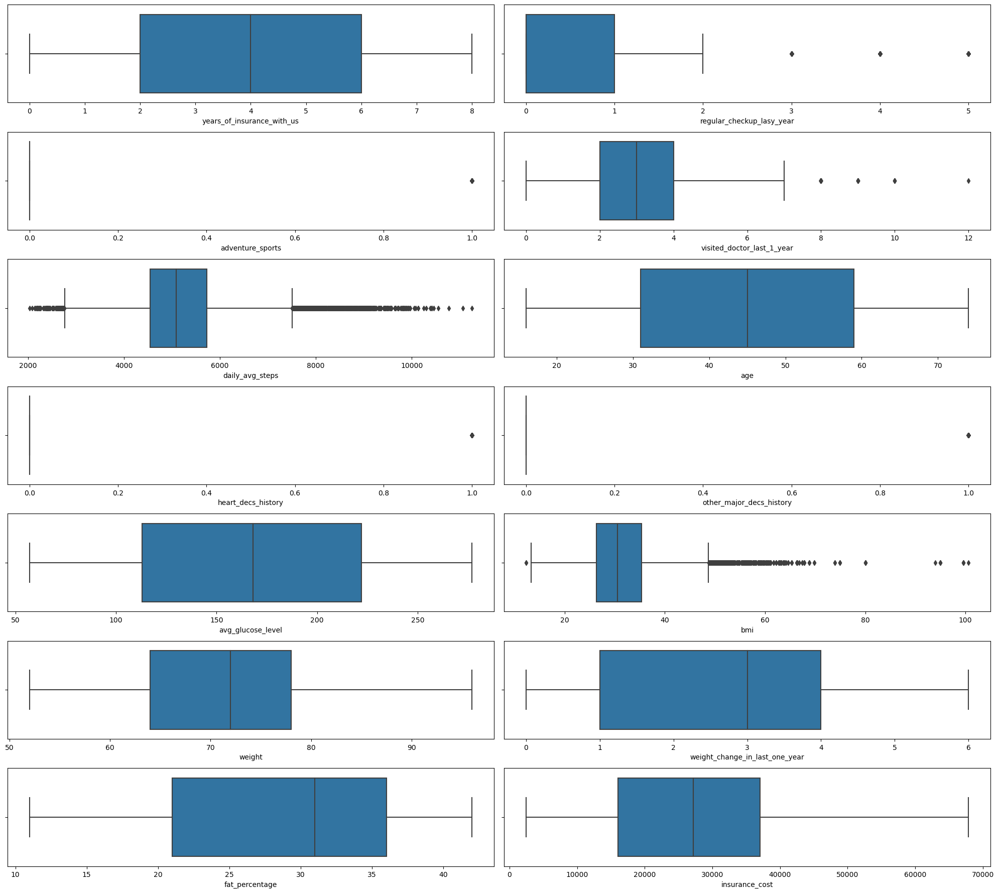

In [96]:
data_plot=df.select_dtypes(['int64','float64'])
fig=plt.figure(figsize=(20,20))
for i in range(0,len(data_plot.columns)):
    ax=fig.add_subplot(8,2,i+1)
    sns.boxplot(data_plot[data_plot.columns[i]])
    plt.tight_layout()
print('Shape before Outliers Treatment',df.shape)

In [8]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [17]:
((df > UL) | (df < LL)).sum()

Alcohol                              0
Gender                               0
Location                             0
Occupation                           0
adventure_sports                  2043
age                                  0
avg_glucose_level                    0
bmi                                624
cholesterol_level                    0
covered_by_any_other_company         0
daily_avg_steps                    952
exercise                             0
fat_percentage                       0
heart_decs_history                1366
insurance_cost                       0
other_major_decs_history          2454
regular_checkup_lasy_year         2943
smoking_status                       0
visited_doctor_last_1_year          96
weight                               0
weight_change_in_last_one_year       0
years_of_insurance_with_us           0
dtype: int64

We keep the adventure_sports as it is, as it seems like a true value and also it is a categorical variable.

In [24]:
df['bmi'].describe()

count    25000.000000
mean        31.357952
std          7.720963
min         12.300000
25%         26.300000
50%         30.500000
75%         35.300000
max        100.600000
Name: bmi, dtype: float64

In [13]:
UL

applicant_id                      42498.5
years_of_insurance_with_us           12.0
regular_checkup_lasy_year             2.5
adventure_sports                      0.0
visited_doctor_last_1_year            7.0
daily_avg_steps                    7510.5
age                                 101.0
heart_decs_history                    0.0
other_major_decs_history              0.0
avg_glucose_level                   385.5
bmi                                  48.8
weight                               99.0
weight_change_in_last_one_year        8.5
fat_percentage                       58.5
insurance_cost                    68487.0
dtype: float64

In [14]:
LL

applicant_id                      -7499.5
years_of_insurance_with_us           -4.0
regular_checkup_lasy_year            -1.5
adventure_sports                      0.0
visited_doctor_last_1_year           -1.0
daily_avg_steps                    2762.5
age                                 -11.0
heart_decs_history                    0.0
other_major_decs_history              0.0
avg_glucose_level                   -50.5
bmi                                  12.8
weight                               43.0
weight_change_in_last_one_year       -3.5
fat_percentage                       -1.5
insurance_cost                   -15425.0
dtype: float64

In [9]:
df['bmi']=np.where(df['bmi']> 48.8,48.8,df['bmi'])
df['bmi']=np.where(df['bmi']< 12.8,12.8,df['bmi'])

df['daily_avg_steps']=np.where(df['daily_avg_steps']< 2762.5,2762.5,df['daily_avg_steps'])
df['daily_avg_steps']=np.where(df['daily_avg_steps']> 7510.5,7510.5,df['daily_avg_steps'])




Shape after Outliers Treatment (25000, 22)


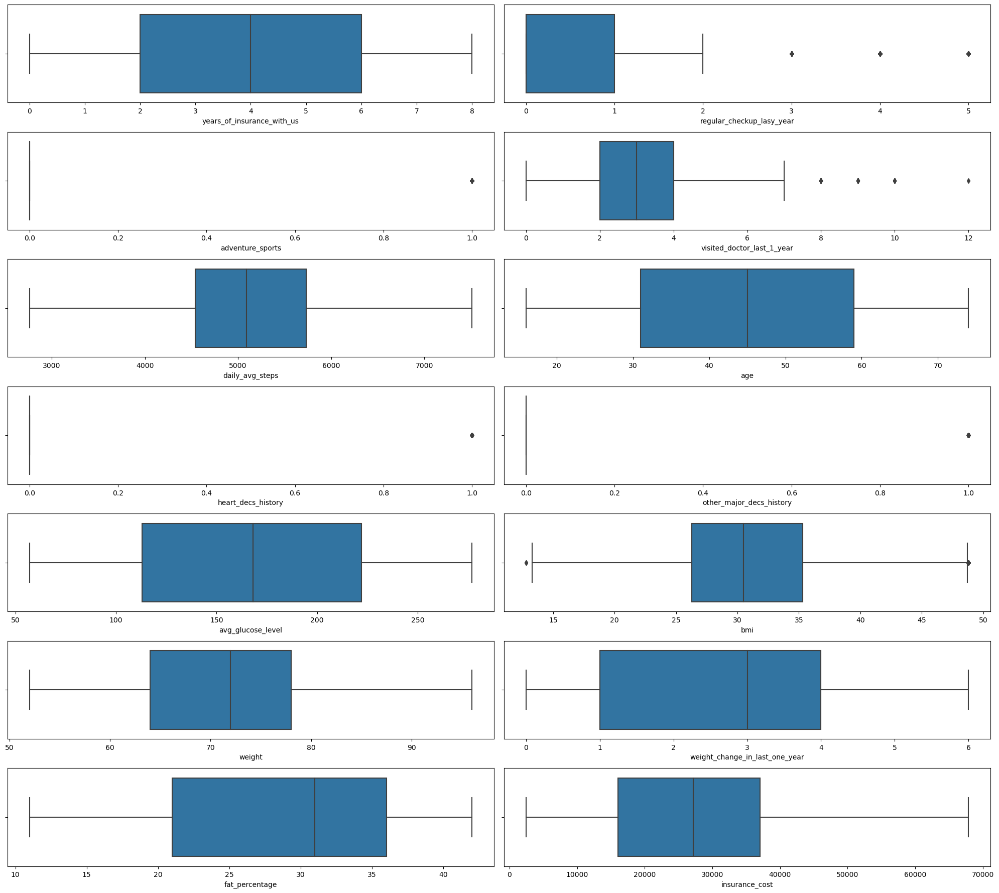

In [16]:
data_plot=df.select_dtypes(['int64','float64'])
fig=plt.figure(figsize=(20,20))
for i in range(0,len(data_plot.columns)):
    ax=fig.add_subplot(8,2,i+1)
    sns.boxplot(data_plot[data_plot.columns[i]])
    plt.tight_layout()
print('Shape after Outliers Treatment',df.shape)

In [10]:
df.shape

(25000, 23)

In [92]:
df.isnull().sum()

years_of_insurance_with_us        0
regular_checkup_lasy_year         0
adventure_sports                  0
Occupation                        0
visited_doctor_last_1_year        0
cholesterol_level                 0
daily_avg_steps                   0
age                               0
heart_decs_history                0
other_major_decs_history          0
Gender                            0
avg_glucose_level                 0
bmi                               0
smoking_status                    0
Location                          0
weight                            0
covered_by_any_other_company      0
Alcohol                           0
exercise                          0
weight_change_in_last_one_year    0
fat_percentage                    0
insurance_cost                    0
dtype: int64

In [16]:
df["Year_last_admitted"].value_counts()

KeyError: 'Year_last_admitted'

In [ ]:
df["Year_last_admitted"]

In [17]:
corr = df.corr(method='pearson')

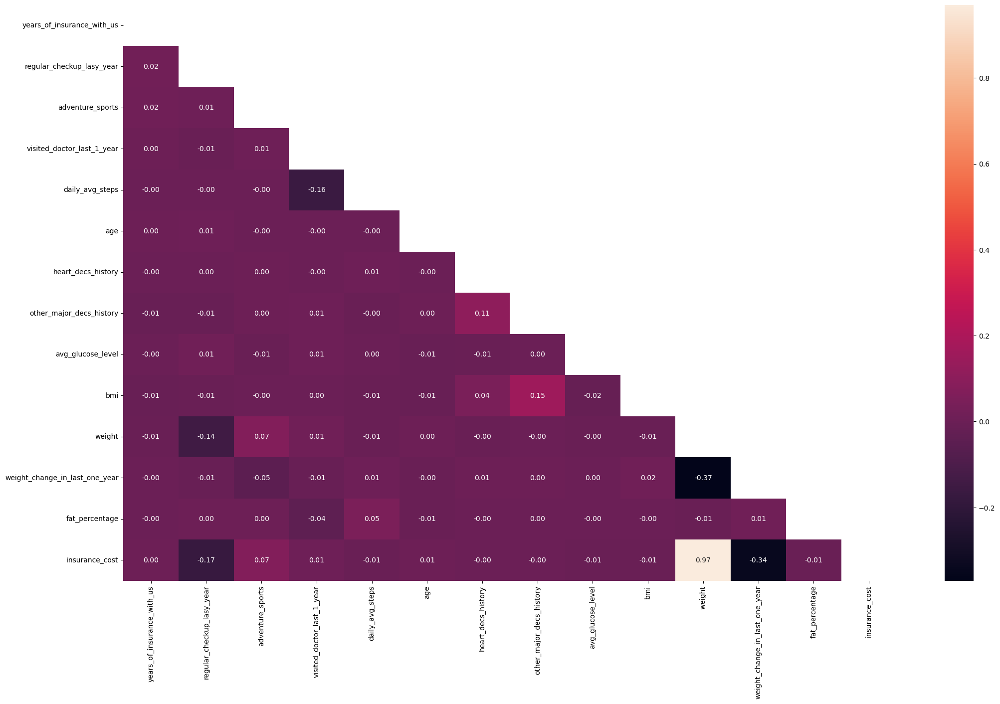

In [18]:
mask = np.triu(np.ones_like(corr, dtype=np.bool)) 
fig = plt.subplots(figsize=(25, 15))
sns.heatmap(df.corr(), annot=True,fmt='.2f',mask=mask)
plt.show()

In [ ]:
pair plot use hue

identify collinearity between independent variables — linear regression assumes no collinearity among independent features, therefore it is essential to drop some features if collinearity exists. In this example, none of the independent variables are highly correlated with another, hence no need of dropping any.
identify independent variables that are strongly correlated with the target — they are the strong predictors. Once again, we can see that “weight” is correlated with insurance_cost.

In [ ]:
1. Log Transformation
We have found out that target variable — “insurancecost” is right skewed. Since linear regression assumes linear relationship between input and output variable, it is necessary to use log transformation to “” variable. As shown below, the data tends to be more normally distributed after applying np.log2(). Besides, spoiler alert, this transformation does increase the linear regression model score from 0.76 to 0.78.

In [ ]:
Feature engineering

In [ ]:
1)transformation
2)encoding

In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  int64  
 1   regular_checkup_lasy_year       25000 non-null  int64  
 2   adventure_sports                25000 non-null  int64  
 3   Occupation                      25000 non-null  object 
 4   visited_doctor_last_1_year      25000 non-null  int64  
 5   cholesterol_level               25000 non-null  object 
 6   daily_avg_steps                 25000 non-null  float64
 7   age                             25000 non-null  int64  
 8   heart_decs_history              25000 non-null  int64  
 9   other_major_decs_history        25000 non-null  int64  
 10  Gender                          25000 non-null  object 
 11  avg_glucose_level               25000 non-null  int64  
 12  bmi                             

In [ ]:
onehot encoding

In [10]:
columns_cat = ['Gender','Occupation','smoking_status','Location','Alcohol','covered_by_any_other_company']
df_encoded = pd.get_dummies(df, columns=columns_cat,drop_first = True)
df_encoded

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,other_major_decs_history,avg_glucose_level,...,Location_Kolkata,Location_Lucknow,Location_Mangalore,Location_Mumbai,Location_Nagpur,Location_Pune,Location_Surat,Alcohol_No,Alcohol_Rare,covered_by_any_other_company_Y
0,3,1,1,2,125 to 150,4866.0,28,1,0,97,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,4,150 to 175,6411.0,50,0,0,212,...,0,0,0,0,0,0,0,0,1,0
2,1,0,0,4,200 to 225,4509.0,68,0,0,166,...,0,0,0,0,0,0,0,0,0,0
3,7,4,0,2,175 to 200,6214.0,51,0,0,109,...,0,0,0,0,0,0,0,0,1,1
4,3,1,0,2,150 to 175,4938.0,44,0,1,118,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,3,0,0,4,225 to 250,5614.0,22,0,0,145,...,0,0,0,0,0,0,0,0,1,1
24996,6,0,0,4,200 to 225,4719.0,58,0,0,134,...,0,0,0,0,0,0,0,0,1,0
24997,7,0,1,2,150 to 175,5624.0,34,0,1,151,...,0,0,0,0,0,0,0,0,1,0
24998,1,0,0,2,225 to 250,7510.5,27,0,0,66,...,0,0,0,0,0,0,1,0,1,0


In [42]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  int64  
 1   regular_checkup_lasy_year       25000 non-null  int64  
 2   adventure_sports                25000 non-null  int64  
 3   visited_doctor_last_1_year      25000 non-null  int64  
 4   cholesterol_level               25000 non-null  object 
 5   daily_avg_steps                 25000 non-null  float64
 6   age                             25000 non-null  int64  
 7   heart_decs_history              25000 non-null  int64  
 8   other_major_decs_history        25000 non-null  int64  
 9   avg_glucose_level               25000 non-null  int64  
 10  bmi                             25000 non-null  float64
 11  weight                          25000 non-null  int64  
 12  exercise                        

In [11]:
for feature in df_encoded.columns: 
    if df_encoded[feature].dtype == 'object':
        df_encoded[feature] = pd.Categorical(df_encoded[feature]).codes

In [113]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  int64  
 1   regular_checkup_lasy_year       25000 non-null  int64  
 2   adventure_sports                25000 non-null  int64  
 3   visited_doctor_last_1_year      25000 non-null  int64  
 4   cholesterol_level               25000 non-null  int8   
 5   daily_avg_steps                 25000 non-null  float64
 6   age                             25000 non-null  int64  
 7   heart_decs_history              25000 non-null  int64  
 8   other_major_decs_history        25000 non-null  int64  
 9   avg_glucose_level               25000 non-null  int64  
 10  bmi                             25000 non-null  float64
 11  weight                          25000 non-null  int64  
 12  exercise                        

In [34]:
#df_encoded=pd.concat([df_encoded, df['insurance_cost']], axis=1)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   years_of_insurance_with_us      25000 non-null  int64  
 1   regular_checkup_lasy_year       25000 non-null  int64  
 2   adventure_sports                25000 non-null  int64  
 3   Occupation                      25000 non-null  int8   
 4   visited_doctor_last_1_year      25000 non-null  int64  
 5   cholesterol_level               25000 non-null  int8   
 6   daily_avg_steps                 25000 non-null  float64
 7   age                             25000 non-null  int64  
 8   heart_decs_history              25000 non-null  int64  
 9   other_major_decs_history        25000 non-null  int64  
 10  Gender                          25000 non-null  int8   
 11  avg_glucose_level               25000 non-null  int64  
 12  bmi                             

In [12]:
from sklearn.preprocessing import StandardScaler

In [13]:
x= StandardScaler()

In [14]:
scaled_df = x.fit_transform(df_encoded)

In [15]:
scaled_df

array([[-0.41780748,  0.18869048,  3.35214954, ..., -0.72036506,
         0.90438786, -0.65977028],
       [-1.56874998, -0.64504266, -0.29831605, ..., -0.72036506,
         0.90438786, -0.65977028],
       [-1.18510248, -0.64504266, -0.29831605, ..., -0.72036506,
        -1.10572029, -0.65977028],
       ...,
       [ 1.11678253, -0.64504266,  3.35214954, ..., -0.72036506,
         0.90438786, -0.65977028],
       [-1.18510248, -0.64504266, -0.29831605, ..., -0.72036506,
         0.90438786, -0.65977028],
       [ 1.50043003,  1.02242363, -0.29831605, ...,  1.38818505,
        -1.10572029, -0.65977028]])

In [35]:
df_encoded.columns

Index(['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'insurance_cost', 'Gender_Male', 'Occupation_Salried',
       'Occupation_Student', 'smoking_status_formerly smoked',
       'smoking_status_never smoked', 'smoking_status_smokes',
       'Location_Bangalore', 'Location_Bhubaneswar', 'Location_Chennai',
       'Location_Delhi', 'Location_Guwahati', 'Location_Jaipur',
       'Location_Kanpur', 'Location_Kolkata', 'Location_Lucknow',
       'Location_Mangalore', 'Location_Mumbai', 'Location_Nagpur',
       'Location_Pune', 'Location_Surat', 'Alcohol_No', 'Alcohol_Rare',
       'covered_by_any_other_company_Y', 'insurance_cost'],
      dtype='object')

In [16]:
scaled_df = pd.DataFrame(scaled_df,columns = ['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'insurance_cost', 'Gender_Male', 'Occupation_Salried',
       'Occupation_Student', 'smoking_status_formerly smoked',
       'smoking_status_never smoked', 'smoking_status_smokes',
       'Location_Bangalore', 'Location_Bhubaneswar', 'Location_Chennai',
       'Location_Delhi', 'Location_Guwahati', 'Location_Jaipur',
       'Location_Kanpur', 'Location_Kolkata', 'Location_Lucknow',
       'Location_Mangalore', 'Location_Mumbai', 'Location_Nagpur',
       'Location_Pune', 'Location_Surat', 'Alcohol_No', 'Alcohol_Rare',
       'covered_by_any_other_company_Y'])

In [22]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [29]:
link_method = linkage(scaled_df, method = 'average')

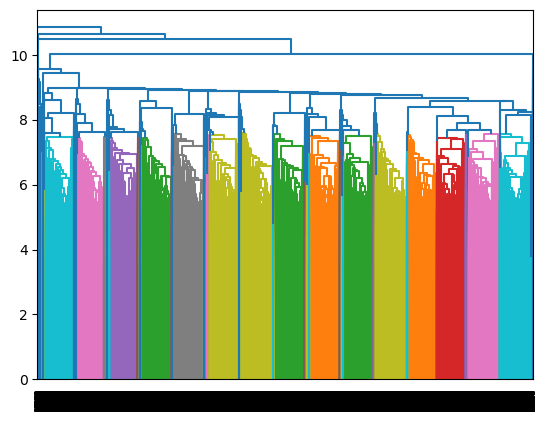

In [30]:
dend = dendrogram(link_method)

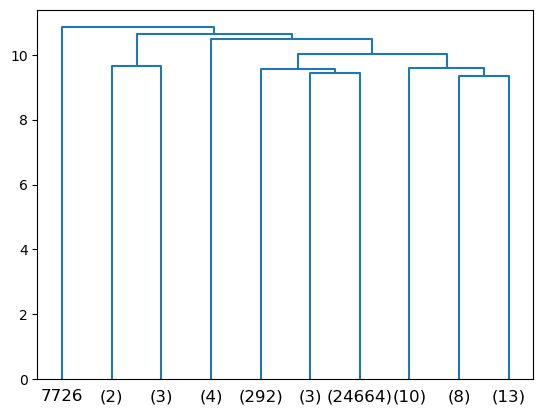

In [38]:
dend = dendrogram(link_method,
                 truncate_mode='lastp',
                 p = 10
                 )

In [32]:
from scipy.cluster.hierarchy import fcluster

In [33]:
# Set criterion as maxclust,then create 3 clusters, and store the result in another object 'clusters'
clusters = fcluster(link_method, 3, criterion='maxclust')
clusters

array([2, 2, 2, ..., 2, 2, 2], dtype=int32)

In [34]:
df['clusters'] = clusters

In [35]:
df.clusters.value_counts().sort_index()

1        5
2    24994
3        1
Name: clusters, dtype: int64

In [36]:
aggdata=df.groupby('clusters').mean()
aggdata['Freq']=df.clusters.value_counts().sort_index()
aggdata

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,visited_doctor_last_1_year,daily_avg_steps,age,heart_decs_history,other_major_decs_history,avg_glucose_level,bmi,weight,weight_change_in_last_one_year,fat_percentage,insurance_cost,Freq
clusters,,,,,,,,,,,,,,,
1,7.400000,0.800000,0.00000,7.600000,3969.200000,39.800000,0.600000,0.800000,134.400000,30.600000,69.400000,2.000000,25.600000,22212.000000,5
2,4.088501,0.773706,0.08174,3.103345,5189.305993,44.920301,0.054493,0.097984,167.532528,31.183868,71.610066,2.518004,28.812555,27147.012563,24994
3,1.000000,0.000000,0.00000,2.000000,4208.000000,21.000000,1.000000,1.000000,270.000000,39.400000,93.000000,4.000000,38.000000,61700.000000,1


<AxesSubplot:xlabel='clusters', ylabel='insurance_cost'>

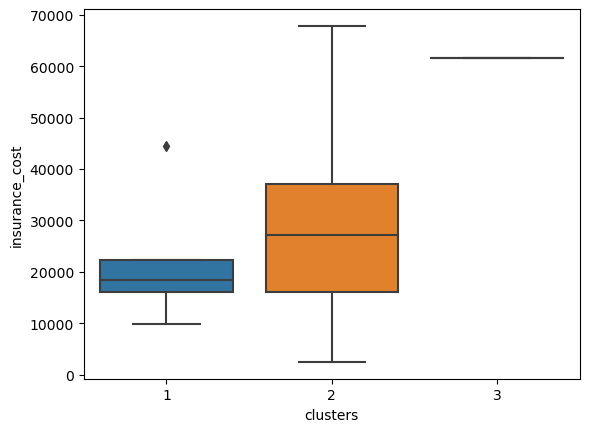

In [37]:
sns.boxplot(x='clusters',y='insurance_cost',data=df)

In [39]:
from sklearn.cluster import KMeans

In [40]:
wss =[] 

In [41]:
for i in range(1,11):
    KM = KMeans(n_clusters=i,random_state=0)
    KM.fit(scaled_df)
    wss.append(KM.inertia_)

In [42]:
wss

[975000.0,
 933221.343729572,
 907809.6781308631,
 885516.9620117419,
 861568.9267679515,
 840156.2731422918,
 813785.0470651184,
 788615.8820249045,
 767572.5764453018,
 736202.6218442805]

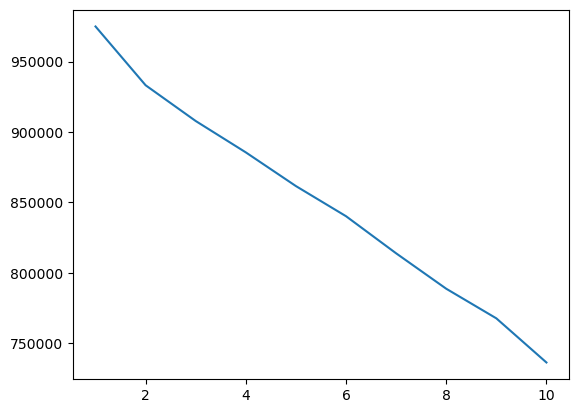

In [43]:
plt.plot(range(1,11), wss)

In [44]:
k_means = KMeans(n_clusters =3,random_state=0)
k_means.fit(scaled_df)
labels = k_means.labels_

In [ ]:
df["Clus_kmeans"] = labels
df.head(5)

In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [ ]:
silhouette_score(scaled_df,labels,random_state=0)

In [ ]:
sil_width = silhouette_samples(scaled_df,labels)

In [ ]:
sil_width

In [ ]:
df["sil_width"] = sil_width
df.head(5)

In [ ]:
df.Clus_kmeans.value_counts()

In [ ]:
clust_profile=df.drop(['clusters'],axis=1)
clust_profile=clust_profile.groupby('Clus_kmeans').mean()
clust_profile['freq']=df.Clus_kmeans.value_counts()
clust_profile

In [ ]:
silhouette_samples(scaled_df,labels).min()

In [ ]:
drop cluster column

In [38]:
df_encoded.head()

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,other_major_decs_history,avg_glucose_level,...,Location_Lucknow,Location_Mangalore,Location_Mumbai,Location_Nagpur,Location_Pune,Location_Surat,Alcohol_No,Alcohol_Rare,covered_by_any_other_company_Y,insurance_cost
0,3,1,1,2,0,4866.0,28,1,0,97,...,0,0,0,0,0,0,0,1,0,20978
1,0,0,0,4,1,6411.0,50,0,0,212,...,0,0,0,0,0,0,0,1,0,6170
2,1,0,0,4,3,4509.0,68,0,0,166,...,0,0,0,0,0,0,0,0,0,28382
3,7,4,0,2,2,6214.0,51,0,0,109,...,0,0,0,0,0,0,0,1,1,27148
4,3,1,0,2,1,4938.0,44,0,1,118,...,0,0,0,0,0,0,1,0,0,29616


In [16]:
x=df_encoded.drop(['insurance_cost'],axis=1) 
y=df_encoded['insurance_cost']

In [17]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=123,test_size=0.25)

In [18]:
x_train.columns

Index(['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly smoked', 'smoking_status_never smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y'],
      dtype='object')

In [19]:
x_test.columns

Index(['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly smoked', 'smoking_status_never smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y'],
      dtype='object')

For gradient descent algorithm like linear regression, it is necessary to do scaling as it will help us to converge to the minimum of gradient descent more faster. 

In [75]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler() 
x_train=ss.fit_transform(x_train)
x_test=ss.transform(x_test)

In [76]:
x_test = pd.DataFrame(x_test,columns = ['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly smoked', 'smoking_status_never smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y'])

In [77]:
x_train = pd.DataFrame(x_train,columns = ['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly smoked', 'smoking_status_never smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y'])

In [22]:
x_train.head()

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,other_major_decs_history,avg_glucose_level,...,Location_Kolkata,Location_Lucknow,Location_Mangalore,Location_Mumbai,Location_Nagpur,Location_Pune,Location_Surat,Alcohol_No,Alcohol_Rare,covered_by_any_other_company_Y
0,0.350694,0.180514,-0.29956,-0.093209,0.583230,1.442206,-0.610061,-0.236603,-0.331255,-1.339837,...,-0.266344,3.800633,-0.270795,-0.269203,-0.266573,-0.264848,-0.260789,1.398076,-1.113377,1.508726
1,-0.802231,0.180514,-0.29956,-0.093209,-0.209777,-0.692650,1.376462,-0.236603,-0.331255,0.858631,...,3.754546,-0.263114,-0.270795,-0.269203,-0.266573,-0.264848,-0.260789,-0.715269,0.898168,-0.662811
2,0.735003,1.834381,3.33823,2.534855,0.583230,-0.265679,-1.044613,-0.236603,3.018819,1.543661,...,-0.266344,-0.263114,-0.270795,3.714665,-0.266573,-0.264848,-0.260789,1.398076,-1.113377,1.508726
3,-1.570848,-0.646420,3.33823,-0.969230,-0.209777,0.253303,-1.665402,-0.236603,-0.331255,-1.610662,...,3.754546,-0.263114,-0.270795,-0.269203,-0.266573,-0.264848,-0.260789,-0.715269,0.898168,-0.662811
4,-1.186539,1.007448,3.33823,3.410876,0.583230,-0.201582,-1.168771,4.226485,-0.331255,-1.706248,...,-0.266344,-0.263114,-0.270795,-0.269203,-0.266573,-0.264848,-0.260789,-0.715269,0.898168,-0.662811


In [67]:
scaled_df.describe().apply(lambda s: s.apply('{0:.5f}'.format))

NameError: name 'scaled_df' is not defined

In [ ]:
Linear Regression Model

In [78]:
regression_model = LinearRegression()
regression_model.fit(x_train, y_train)

LinearRegression()

In [79]:
# Let us explore the coefficients for each of the independent attributes
import numpy as np

coef_array = np.reshape(regression_model.coef_,(1, len(x_train.columns)))
for idx, col_name in enumerate(x_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[idx]))

The coefficient for years_of_insurance_with_us is -59.32147216798254
The coefficient for regular_checkup_lasy_year is -509.98809548110114
The coefficient for adventure_sports is 46.65338972279294
The coefficient for visited_doctor_last_1_year is -59.47650207343328
The coefficient for cholesterol_level is 21.311352738219977
The coefficient for daily_avg_steps is -35.73905655857941
The coefficient for age is 45.602976442486536
The coefficient for heart_decs_history is 50.29187153802399
The coefficient for other_major_decs_history is 18.927936027338205
The coefficient for avg_glucose_level is -11.92746811816601
The coefficient for bmi is -31.86271421552321
The coefficient for weight is 13874.74249430928
The coefficient for exercise is 30.059124768167123
The coefficient for weight_change_in_last_one_year is 265.27550973562313
The coefficient for fat_percentage is -22.15681590433286
The coefficient for Gender_Male is 6.159434521541059
The coefficient for Occupation_Salried is 17.57581461435

In [44]:
import numpy as np

coef_array = np.reshape(regression_model.coef_, (1, len(x_train.columns)))
for idx, col_name in enumerate(x_train.columns):
    print("The coefficient for {} is {}".format(col_name, coef_array[0][idx]))

The coefficient for years_of_insurance_with_us is -59.32147216798254
The coefficient for regular_checkup_lasy_year is -509.98809548110114
The coefficient for adventure_sports is 46.65338972279294
The coefficient for visited_doctor_last_1_year is -59.47650207343328
The coefficient for cholesterol_level is 21.311352738219977
The coefficient for daily_avg_steps is -35.73905655857941
The coefficient for age is 45.602976442486536
The coefficient for heart_decs_history is 50.29187153802399
The coefficient for other_major_decs_history is 18.927936027338205
The coefficient for avg_glucose_level is -11.92746811816601
The coefficient for bmi is -31.86271421552321
The coefficient for weight is 13874.74249430928
The coefficient for exercise is 30.059124768167123
The coefficient for weight_change_in_last_one_year is 265.27550973562313
The coefficient for fat_percentage is -22.15681590433286
The coefficient for Gender_Male is 6.159434521541059
The coefficient for Occupation_Salried is 17.57581461435

In [45]:
# Let us check the intercept for the model

intercept = regression_model.intercept_

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 27172.021866666662


In [32]:
# R square on training data
regression_model.score(x_train, y_train)

0.9452015003848773

In [ ]:
 R2 score to get the accuracy of your model on a percentage scale, that is 0–100

In [33]:
# R square on testing data
regression_model.score(x_test, y_test)

0.9431947777369061

In [43]:
from sklearn import metrics

In [36]:
#RMSE on Training data
predicted_train=regression_model.fit(x_train, y_train).predict(x_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

3350.806762304237

In [37]:
#RMSE on Testing data
predicted_test=regression_model.fit(x_train, y_train).predict(x_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

3420.3793051442744

We can now very well see that just by scaling our target variable our RMSE and MAE scores have dropped creating an illusion that our model has improved, but actually NOT. When we scale back our model's predictions we are into the same state.

So coming to the point, MAPE (Mean Absolute Percentage Error) could be a better way to measure your performance of the model and it is insensitive to the scale in which the variables are measure. If you compute MAPE for both the sets of values we see that they are same

In [38]:
predicted_train=regression_model.fit(x_train, y_train).predict(x_train)
(metrics.mean_absolute_percentage_error(y_train,predicted_train))

0.15194274647343817

In [42]:
metrics.mean_absolute_percentage_error(y_test,predicted_test)

0.15457637834592675

In [102]:
import numpy as np
def mean_absolute_percentage_error(y_train, predicted_train): 
    y_true, y_pred = np.array(y_train), np.array(predicted_train)
    return np.mean(np.abs((y_train - predicted_train) / y_train)) * 100
print(mean_absolute_percentage_error(y_train, predicted_train))

15.216416033887855


In [43]:
#RMSE on Testing data
predicted_test=regression_model.fit(x_train, y_train).predict(x_test)
metrics.mean_absolute_percentage_error(y_test,predicted_test)

0.15457637834592675

In [ ]:
Linear regression-ols

In [80]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=123,test_size=0.25)

In [81]:
x_train.head()

,years_of_insurance_with_us,regular_checkup_lasy_year,adventure_sports,visited_doctor_last_1_year,cholesterol_level,daily_avg_steps,age,heart_decs_history,other_major_decs_history,avg_glucose_level,...,Location_Kolkata,Location_Lucknow,Location_Mangalore,Location_Mumbai,Location_Nagpur,Location_Pune,Location_Surat,Alcohol_No,Alcohol_Rare,covered_by_any_other_company_Y
6104,5,1,0,3,2,6585.0,35,0,0,83,...,0,1,0,0,0,0,0,1,0,1
6567,2,1,0,3,1,4520.0,67,0,0,221,...,1,0,0,0,0,0,0,0,1,0
16517,6,3,1,6,2,4933.0,28,0,1,264,...,0,0,0,1,0,0,0,1,0,1
11753,0,0,1,2,1,5435.0,18,0,0,66,...,1,0,0,0,0,0,0,0,1,0
10256,1,2,1,7,2,4995.0,26,1,0,60,...,0,0,0,0,0,0,0,0,1,0


In [82]:
X_train=sm.add_constant(x_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(x_test)

In [83]:
model = sm.OLS(y_train,X_train).fit()
model

In [ ]:
To treat multicollinearity-VARIANCE INFLATION FACTOR

In [ ]:
No (perfect) multicollinearity
In other words, the features should be linearly independent. What does that mean in practice? We should not be able to use a linear model to accurately predict one feature using another one. Let’s take X1 and X2 as examples of features. It could happen that X1 = 2 + 3 * X2, which violates the assumption.

One scenario to watch out for is the ‘dummy variable trap’ — when we use dummy variables to encode a categorical feature and do not omit the baseline level from the model. This results in a perfect correlation between the dummy variables and the constant term.

In [84]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [85]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler() 
# we are scaling the data for ANN. Without scaling it will give very poor results. Computations becomes easier
x_train=ss.fit_transform(x_train)
x_test=ss.transform(x_test)

In [86]:
x_test = pd.DataFrame(x_test,columns = ['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly smoked', 'smoking_status_never smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y'])

In [87]:
x_train = pd.DataFrame(x_train,columns = ['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly smoked', 'smoking_status_never smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y'])

In [88]:
scaled_df=df_encoded.drop('insurance_cost', axis = 1)

In [89]:
scaled_df.columns

Index(['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly smoked', 'smoking_status_never smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y'],
      dtype='object')

In [90]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler() 
# we are scaling the data for ANN. Without scaling it will give very poor results. Computations becomes easier
scaled_df=ss.fit_transform(scaled_df)


In [91]:
scaled_df = pd.DataFrame(scaled_df,columns = ['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried',
       'Occupation_Student', 'smoking_status_formerly smoked',
       'smoking_status_never smoked', 'smoking_status_smokes',
       'Location_Bangalore', 'Location_Bhubaneswar', 'Location_Chennai',
       'Location_Delhi', 'Location_Guwahati', 'Location_Jaipur',
       'Location_Kanpur', 'Location_Kolkata', 'Location_Lucknow',
       'Location_Mangalore', 'Location_Mumbai', 'Location_Nagpur',
       'Location_Pune', 'Location_Surat', 'Alcohol_No', 'Alcohol_Rare',
       'covered_by_any_other_company_Y'])

In [92]:
df_encoded.head().T

,0,1,2,3,4
years_of_insurance_with_us,3.0,0.0,1.0,7.0,3.0
regular_checkup_lasy_year,1.0,0.0,0.0,4.0,1.0
adventure_sports,1.0,0.0,0.0,0.0,0.0
visited_doctor_last_1_year,2.0,4.0,4.0,2.0,2.0
cholesterol_level,0.0,1.0,3.0,2.0,1.0
daily_avg_steps,4866.0,6411.0,4509.0,6214.0,4938.0
age,28.0,50.0,68.0,51.0,44.0
heart_decs_history,1.0,0.0,0.0,0.0,0.0
other_major_decs_history,0.0,0.0,0.0,0.0,1.0
avg_glucose_level,97.0,212.0,166.0,109.0,118.0


In [93]:
scaled_df.head().T

,0,1,2,3,4
years_of_insurance_with_us,-0.417807,-1.568750,-1.185102,1.116783,-0.417807
regular_checkup_lasy_year,0.188690,-0.645043,-0.645043,2.689890,0.188690
adventure_sports,3.352150,-0.298316,-0.298316,-0.298316,-0.298316
visited_doctor_last_1_year,-0.967205,0.784661,0.784661,-0.967205,-0.967205
cholesterol_level,-1.002742,-0.210186,1.374926,0.582370,-0.210186
daily_avg_steps,-0.333160,1.260326,-0.701364,1.057144,-0.258901
age,-1.050360,0.315492,1.433007,0.377576,-0.057013
heart_decs_history,4.159520,-0.240412,-0.240412,-0.240412,-0.240412
other_major_decs_history,-0.329915,-0.329915,-0.329915,-0.329915,3.031081
avg_glucose_level,-1.124370,0.708929,-0.024391,-0.933069,-0.789594


In [94]:
calc_vif(scaled_df).sort_values(by = 'VIF', ascending = False)

,variables,VIF
36,Alcohol_Rare,2.766929
35,Alcohol_No,2.766611
21,Location_Bangalore,1.903205
26,Location_Jaipur,1.882151
22,Location_Bhubaneswar,1.881714
30,Location_Mangalore,1.878420
24,Location_Delhi,1.874200
25,Location_Guwahati,1.866678
23,Location_Chennai,1.865273
31,Location_Mumbai,1.862933


In [95]:
y = df_encoded['insurance_cost']

In [96]:
X=scaled_df

In [97]:
Default_Train = pd.concat([x_train, y_train], axis = 1)
Default_Test = pd.concat([x_test, y_test], axis = 1)

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

In [99]:
Default_train = pd.concat([X_train, y_train], axis = 1)
Default_test = pd.concat([X_test, y_test], axis = 1)

In [100]:
Default_train.columns = Default_train.columns.str.replace(' ', '_')

In [101]:
Default_test.columns = Default_test.columns.str.replace(' ', '_')

In [102]:
Default_train.columns

Index(['years_of_insurance_with_us', 'regular_checkup_lasy_year',
       'adventure_sports', 'visited_doctor_last_1_year', 'cholesterol_level',
       'daily_avg_steps', 'age', 'heart_decs_history',
       'other_major_decs_history', 'avg_glucose_level', 'bmi', 'weight',
       'exercise', 'weight_change_in_last_one_year', 'fat_percentage',
       'Gender_Male', 'Occupation_Salried', 'Occupation_Student',
       'smoking_status_formerly_smoked', 'smoking_status_never_smoked',
       'smoking_status_smokes', 'Location_Bangalore', 'Location_Bhubaneswar',
       'Location_Chennai', 'Location_Delhi', 'Location_Guwahati',
       'Location_Jaipur', 'Location_Kanpur', 'Location_Kolkata',
       'Location_Lucknow', 'Location_Mangalore', 'Location_Mumbai',
       'Location_Nagpur', 'Location_Pune', 'Location_Surat', 'Alcohol_No',
       'Alcohol_Rare', 'covered_by_any_other_company_Y', 'insurance_cost'],
      dtype='object')

In [103]:
import statsmodels.formula.api as smf
lm1 = smf.ols(formula = 'insurance_cost ~ years_of_insurance_with_us+regular_checkup_lasy_year+adventure_sports+visited_doctor_last_1_year+cholesterol_level+daily_avg_steps+age+heart_decs_history+other_major_decs_history+avg_glucose_level+bmi+weight+exercise+weight_change_in_last_one_year+fat_percentage+Gender_Male+Occupation_Salried+Occupation_Student+smoking_status_formerly_smoked+smoking_status_never_smoked+smoking_status_smokes+Location_Bangalore+Location_Bhubaneswar+Location_Chennai+Location_Delhi+Location_Guwahati+Location_Jaipur+Location_Kanpur+Location_Kolkata+Location_Lucknow+Location_Mangalore+Location_Mumbai+Location_Nagpur+Location_Pune+Location_Surat+Alcohol_No+Alcohol_Rare+covered_by_any_other_company_Y', data=Default_train).fit()
print(lm1.summary())

                            OLS Regression Results                            
Dep. Variable:         insurance_cost   R-squared:                       0.945
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     8431.
Date:                Sat, 15 Apr 2023   Prob (F-statistic):               0.00
Time:                        20:43:20   Log-Likelihood:            -1.7886e+05
No. Observations:               18750   AIC:                         3.578e+05
Df Residuals:                   18711   BIC:                         3.581e+05
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [104]:
import statsmodels.formula.api as smf
lm2 = smf.ols(formula = 'insurance_cost ~ regular_checkup_lasy_year+adventure_sports+visited_doctor_last_1_year+age+heart_decs_history+weight+weight_change_in_last_one_year+Location_Delhi+covered_by_any_other_company_Y', data=Default_train).fit()
print(lm2.summary())

                            OLS Regression Results                            
Dep. Variable:         insurance_cost   R-squared:                       0.945
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                 3.560e+04
Date:                Sat, 15 Apr 2023   Prob (F-statistic):               0.00
Time:                        20:43:25   Log-Likelihood:            -1.7888e+05
No. Observations:               18750   AIC:                         3.578e+05
Df Residuals:                   18740   BIC:                         3.579e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [105]:
## Prediction on Training and Test set

y_pred_1_Train = lm2.fittedvalues
y_pred_1_Test = lm2.predict(Default_test)

In [106]:
from sklearn.metrics import mean_squared_error

In [119]:
from sklearn.metrics import mean_squared_error

print('RMSE on Training Set for Model 1:',mean_squared_error(y_true=Default_train['insurance_cost'],y_pred=y_pred_1_Train,squared=False))

RMSE on Training Set for Model 1: 3365.1198386330175


In [108]:
print('RMSE on Test Set for Model 1:',mean_squared_error(y_true=Default_test['insurance_cost'],y_pred=y_pred_1_Test,squared=False))

RMSE on Test Set for Model 1: 3383.0473703755742


In [109]:
from sklearn.metrics import mean_absolute_percentage_error

In [120]:
print('MAPE on Training Set for Model 1:',mean_absolute_percentage_error(y_true=Default_train['insurance_cost'],y_pred=y_pred_1_Train))

MAPE on Training Set for Model 1: 0.15174028400895687


In [121]:
print('MAPE on Test Set for Model 1:',mean_absolute_percentage_error(y_true=Default_test['insurance_cost'],y_pred=y_pred_1_Test))

MAPE on Test Set for Model 1: 0.15567769400593012


In [117]:
r2_train = r2_score(y_true=Default_train['insurance_cost'], y_pred=y_pred_1_Train)
r2_train

0.9447383105399607

In [118]:
r2_test = r2_score(y_true=Default_test['insurance_cost'], y_pred=y_pred_1_Test)
r2_test

0.944412070536664

In [89]:
y_pred_1_Train.head()

6920     16226.533310
17926    34604.259963
1123     40893.201925
4518     42032.820847
5576     33603.078317
dtype: float64

In [90]:
Default_train['insurance_cost'].head()

6920     16042
17926    35786
1123     38254
4518     40722
5576     33318
Name: insurance_cost, dtype: int64

RIdge and Lasso

In [137]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso

In [138]:
ridge = Ridge(alpha=.3)
ridge=ridge.fit(X_train,y_train)
print ("Ridge model:", (ridge.coef_))

Ridge model: [-3.16942379e+01 -5.38799805e+02  5.93733696e+01 -5.63852709e+01
  3.90027470e+01 -1.39580257e+01  6.90372600e+01  6.61390362e+01
  8.15530988e+00  1.73865164e+01 -3.12954764e+01  1.38634574e+04
  2.05806785e+01  2.78148195e+02 -2.07515604e+01  1.85781632e+01
  4.10743729e+01  3.61141348e+01  3.87972889e-01  6.99162371e+00
 -2.89311864e+01  8.26801316e+01  6.78211543e+01  1.11729302e+02
  1.34147266e+02  7.20668748e+01  9.77951167e+01  5.65028341e+01
  8.38069490e+01  9.24208098e+01  8.97688013e+01  9.43983007e+01
  8.51764438e+01  6.76270435e+01  7.31292214e+01  5.57315611e+00
  1.84748031e+01  5.85454180e+02]


In [139]:
lasso = Lasso(alpha=20)
lasso=lasso.fit(X_train,y_train)
print ("Lasso model:", (lasso.coef_))

Lasso model: [-4.24302902e+00 -5.19244254e+02  3.87009153e+01 -3.47451369e+01
  1.15799790e-01 -0.00000000e+00  4.84430534e+01  4.63578971e+01
  0.00000000e+00  0.00000000e+00 -2.04648246e+00  1.38380280e+04
  5.36480403e-01  2.46395462e+02 -2.35659675e+00  0.00000000e+00
  1.48366924e+01  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.06091602e+01  0.00000000e+00 -0.00000000e+00  1.49647722e+01
  3.53790164e+01 -0.00000000e+00  1.47501420e+00 -2.76748171e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
  0.00000000e+00  5.55790027e+02]


In [140]:
print(ridge.score(X_train, y_train))
print(ridge.score(X_test, y_test))

0.9448186515824268
0.9443799815153219


In [148]:
ridge = Ridge(alpha=.3)
models=[ridge]
rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]
MAPE_train=[]
MAPE_test=[]
for i in models:  
    i.fit(X_train,y_train)
    scores_train.append(i.score(X_train, y_train))
    scores_test.append(i.score(X_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X_test))))
    MAPE_train.append(mean_absolute_percentage_error(y_train,i.predict(X_train)))
    MAPE_test.append(mean_absolute_percentage_error(y_test,i.predict(X_test)))
print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test,'Train MAPE':MAPE_train,'Test MAPE':MAPE_test},
            index=['Ridge']))

        Train RMSE    Test RMSE  Training Score  Test Score  Train MAPE  \
Ridge  3362.672795  3384.023689        0.944819     0.94438    0.151534   

       Test MAPE  
Ridge   0.155617  


In [142]:
y_pred_L_Test = lasso.predict(X_test)

In [143]:
r2 = r2_score(y_test, y_pred_L_Test)

In [144]:
r2

0.944443364124912

In [145]:
print(lasso.score(X_train, y_train))
print(lasso.score(X_test, y_test))

0.9447328662169568
0.944443364124912


In [149]:
lasso = Lasso(alpha=20)
models=[lasso]
rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]
MAPE_train=[]
MAPE_test=[]
for i in models:  
    i.fit(X_train,y_train)
    scores_train.append(i.score(X_train, y_train))
    scores_test.append(i.score(X_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X_test))))
    MAPE_train.append(mean_absolute_percentage_error(y_train,i.predict(X_train)))
    MAPE_test.append(mean_absolute_percentage_error(y_test,i.predict(X_test)))
print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test,'Train MAPE':MAPE_train,'Test MAPE':MAPE_test},
            index=['Lasso']))

        Train RMSE    Test RMSE  Training Score  Test Score  Train MAPE  \
Lasso  3365.285599  3382.094982        0.944733    0.944443     0.15164   

       Test MAPE  
Lasso   0.155489  


In [129]:
from sklearn.linear_model import ElasticNet
# define elastic net model
elastic_net = ElasticNet(alpha=0.01, l1_ratio=0.95)# Lasso 90 : 10 Ridge
elastic_net=elastic_net.fit(X_train,y_train)
print ("elastic_net model:", (elastic_net.coef_))

elastic_net model: [-3.17105991e+01 -5.39736594e+02  5.98112216e+01 -5.62449938e+01
  3.88926764e+01 -1.39543749e+01  6.89688536e+01  6.60754282e+01
  8.11161531e+00  1.73143518e+01 -3.12431911e+01  1.38554335e+04
  2.05406209e+01  2.75054116e+02 -2.07549769e+01  1.85838591e+01
  4.09632581e+01  3.59905974e+01  2.89983947e-01  6.99677647e+00
 -2.90030860e+01  8.19844318e+01  6.71970879e+01  1.11101373e+02
  1.33403033e+02  7.13946518e+01  9.70554531e+01  5.57362289e+01
  8.31894654e+01  9.17044439e+01  8.90909770e+01  9.37212854e+01
  8.44485372e+01  6.69362715e+01  7.23928973e+01  5.57843816e+00
  1.84820566e+01  5.85533466e+02]


In [130]:
print(elastic_net.score(X_train, y_train))
print(elastic_net.score(X_test, y_test))

0.9448183678157998
0.9443756580606939


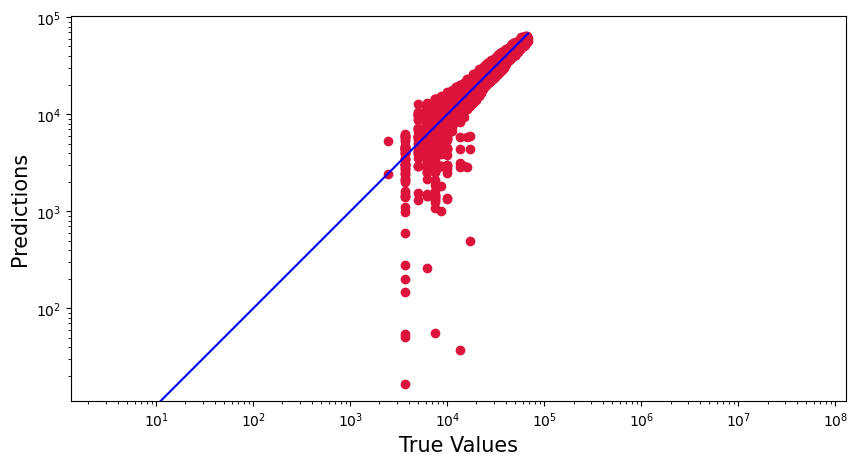

In [112]:
plt.figure(figsize=(10,5))
plt.scatter( Default_test['insurance_cost'],y_pred_1_Test, c='crimson')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(y_pred_1_Test), max(Default_test['insurance_cost']))
p2 = min(min(y_pred_1_Test), min(Default_test['insurance_cost']))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.axis('equal')
plt.show()

In [52]:
dtr = tree.DecisionTreeRegressor(random_state=123)
rfr = RandomForestRegressor(random_state=123)
models=[dtr,rfr]
rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]
MAPE_train=[]
MAPE_test=[]
for i in models:  
    i.fit(X_train,y_train)
    scores_train.append(i.score(X_train, y_train))
    scores_test.append(i.score(X_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X_test))))
    MAPE_train.appen d(mean_absolute_percentage_error(y_train,i.predict(X_train)))
    MAPE_test.append(mean_absolute_percentage_error(y_test,i.predict(X_test)))
print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test,'Train MAPE':MAPE_train,'Test MAPE':MAPE_test},
            index=['Decision Tree Regressor','Random Forest Regressor']))

                          Train RMSE    Test RMSE  Training Score  Test Score  \
Decision Tree Regressor     0.000000  4342.417771        1.000000    0.908414   
Random Forest Regressor  1170.428365  3104.849404        0.993315    0.953178   

                         Train MAPE  Test MAPE  
Decision Tree Regressor    0.000000   0.162508  
Random Forest Regressor    0.045621   0.121848  


In [106]:
param_grid = {
    'max_depth': [10,15,20,25,30],
    'min_samples_leaf': [3, 15,30],
    'min_samples_split': [15,30,35,40,50],
}

dtr=tree.DecisionTreeRegressor(random_state=123)

grid_search = GridSearchCV(estimator = dtr, param_grid = param_grid, cv = 3)


grid_search.fit(X_train,y_train)

print(grid_search.best_params_)

{'max_depth': 10, 'min_samples_leaf': 30, 'min_samples_split': 15}


In [53]:
param_grid = {
    'max_depth': [15,13],
    'max_features': [10,8],
    'min_samples_leaf': [3, 5,30],
    'min_samples_split': [30, 50,100],
    'n_estimators': [300, 500]
}
rfr = RandomForestRegressor(random_state=123)
grid_search = GridSearchCV(estimator = rfr, param_grid = param_grid, cv = 3)


In [54]:
grid_search.fit(X_train,y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=123),
             param_grid={'max_depth': [15, 13], 'max_features': [10, 8],
                         'min_samples_leaf': [3, 5, 30],
                         'min_samples_split': [30, 50, 100],
                         'n_estimators': [300, 500]})

In [55]:
print(grid_search.best_params_)

{'max_depth': 15, 'max_features': 10, 'min_samples_leaf': 3, 'min_samples_split': 30, 'n_estimators': 500}


In [56]:
rfr = RandomForestRegressor(max_depth=15, max_features=10, 
                            min_samples_leaf= 3,
                            min_samples_split= 30, n_estimators= 500,
                            random_state=123)
dtr = tree.DecisionTreeRegressor(max_depth=10,min_samples_split=15,min_samples_leaf=30,random_state=123)
models=[dtr,rfr]
rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]
MAPE_train=[]
MAPE_test=[]
for i in models:  
    i.fit(X_train,y_train)
    scores_train.append(i.score(X_train, y_train))
    scores_test.append(i.score(X_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X_test))))
    MAPE_train.append(mean_absolute_percentage_error(y_train,i.predict(X_train)))
    MAPE_test.append(mean_absolute_percentage_error(y_test,i.predict(X_test)))
print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test,'Train MAPE':MAPE_train,'Test MAPE':MAPE_test},
            index=['Decision Tree Regressor','Random Forest Regressor']))

                          Train RMSE    Test RMSE  Training Score  Test Score  \
Decision Tree Regressor  2887.768221  3138.698245        0.959304    0.952152   
Random Forest Regressor  2892.187308  3341.268215        0.959180    0.945777   

                         Train MAPE  Test MAPE  
Decision Tree Regressor    0.112740   0.122560  
Random Forest Regressor    0.122403   0.142306  


In [132]:
annr = MLPRegressor(hidden_layer_sizes=(500),random_state=123, max_iter=10000)


In [136]:
models=[annr]

rmse_train=[]
rmse_test=[]
MAPE_train=[]
MAPE_test=[]
scores_train=[]
scores_test=[]
for i in models:
    i.fit(X_train,y_train)
    scores_train.append(i.score(X_train, y_train))
    scores_test.append(i.score(X_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X_test))))
    MAPE_train.append(mean_absolute_percentage_error(y_train,i.predict(X_train)))
    MAPE_test.append(mean_absolute_percentage_error(y_test,i.predict(X_test)))
print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test,'Train MAPE':MAPE_train,'Test MAPE':MAPE_test},
            index=['annr']))

       Train RMSE    Test RMSE  Training Score  Test Score  Train MAPE  \
annr  2773.855422  3227.549837        0.962452    0.949405    0.117544   

      Test MAPE  
annr   0.137191  


In [118]:
from sklearn.model_selection import KFold, GridSearchCV, StratifiedKFold
from sklearn.neighbors import KNeighborsRegressor

In [ ]:
 params = {
    'n_neighbors': [9],  #'n_neighbors': [3,4,5,6,7,8,9,10,11,12], Number of neighbor points to consider for prediction 
    
    'weights': ['distance'],  #'weights': ['uniform', 'distance'], weight function used in prediction
    'p': [1]  #'p': [1,2] # p=1 compute manhattan distance, p=2 compute euclidean distance
    }

knn = KNeighborsRegressor()
rs = GridSearchCV(estimator=knn, param_grid=params, cv=10, n_jobs=-1, scoring='neg_mean_squared_error')
rs.fit(X_train, y_train)
print(rs.best_estimator_)
knn = rs.best_estimator_
start = datetime.now()
knn.fit(X_train, y_train)
pred = knn.predict(X_test)
stop = datetime.now()
delta = stop - start

print('-'*30)
r2 = r2_score(y_test, pred)
print('R2: ', r2)
err = np.sqrt(mean_squared_error(y_test, pred))
print('Root Mean Squared Error: ', err)
seconds = delta.seconds + delta.microseconds/1E6
print('Time to compute: ', seconds, 'seconds')

knn_reg = ('KNN', r2, err, seconds)


In [119]:
 params = {
    'n_neighbors': [3,4,5,6,7,8,9,10,11,12],  #'n_neighbors': [3,4,5,6,7,8,9,10,11,12], Number of neighbor points to consider for prediction 
    
    'weights': ['uniform', 'distance'],  #'weights': ['uniform', 'distance'], weight function used in prediction
    'p':[1,2]  #'p': [1,2] # p=1 compute manhattan distance, p=2 compute euclidean distance
    }
knn = KNeighborsRegressor()
rs = GridSearchCV(estimator=knn, param_grid=params, cv=10, n_jobs=-1, scoring='neg_mean_squared_error')


In [120]:
rs.fit(X_train, y_train)


GridSearchCV(cv=10, estimator=KNeighborsRegressor(), n_jobs=-1,
             param_grid={'n_neighbors': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             scoring='neg_mean_squared_error')

In [121]:
print(rs.best_estimator_)

KNeighborsRegressor(n_neighbors=12, weights='distance')


In [132]:
knn = rs.best_estimator_
knn.fit(X_train, y_train)
pred = knn.predict(X_test)

print('-'*30)
r2 =r2_score(y_test, pred)
print('R2: ', r2)
err = np.sqrt(mean_squared_error(y_test, pred))
print('Root Mean Squared Error: ', err)

knn_reg = ('KNN', r2, err)


------------------------------
R2:  0.8723611436252195
Root Mean Squared Error:  5126.362134865


In [125]:
from sklearn.svm import SVR

In [127]:
params = {'C': [100],         #'C': [0.1,1,10,100]
       'gamma': [0.01,0.1,1,10],     #'gamma': [0.01,0.1,1,10]
#         'kernel': ['linear'],   
        }
#
svr = SVR()
rs = GridSearchCV(estimator=svr, param_grid=params, cv=3, n_jobs=-1, scoring='neg_mean_squared_error')
rs.fit(X_train, y_train)
print(rs.best_estimator_)


SVR(C=100, gamma=0.01)


In [128]:
svr = rs.best_estimator_

In [115]:
from sklearn.metrics import r2_score, mean_squared_error

In [131]:
svr = SVR(C=100, gamma=.01, kernel='linear')
svr.fit(X_train, y_train)
pred = svr.predict(X_test)

print('-'*30)
r2 = r2_score(y_test, pred)
print('R2: ', r2)
err = np.sqrt(mean_squared_error(y_test, pred))
print('Root Mean Squared Error: ', err)


support_vector_reg = ('SVR', r2)

------------------------------
R2:  0.9440410812033926
Root Mean Squared Error:  3394.3176892462507


In [ ]:
df_results = pd.DataFrame([linear_reg, knn_reg, support_vector_reg, decision_tree, random_forest], columns=['model', 'R2','RMSE','comp_time'])
df_results.sort_values('R2',ascending=False)

In [ ]:
Ensemble Learning helps improve machine learning results by combining several models to improve predictive performance compared to a single model.

In [60]:
from sklearn.ensemble import BaggingRegressor

from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb

In [58]:
pip install xgboost

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.

     --------------------------------------- 70.9/70.9 MB 15.2 MB/s eta 0:00:00


In [ ]:
A Bagging regressor is an ensemble meta-estimator that fits base regressors each on random subsets of the original dataset and then aggregate their individual predictions (either by voting or by averaging) to form a final prediction

GradientBoostingRegressor Score= 3137.6402940226653


In [65]:
gradient_boosting_regressor= GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state = 123)
models=[gradient_boosting_regressor]
rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]
MAPE_train=[]
MAPE_test=[]
for i in models:  
    i.fit(X_train,y_train)
    scores_train.append(i.score(X_train, y_train))
    scores_test.append(i.score(X_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X_test))))
    MAPE_train.append(mean_absolute_percentage_error(y_train,i.predict(X_train)))
    MAPE_test.append(mean_absolute_percentage_error(y_test,i.predict(X_test)))
print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test,'Train MAPE':MAPE_train,'Test MAPE':MAPE_test},
            index=['gradient_boosting_regressor']))

                             Train RMSE    Test RMSE  Training Score  \
gradient_boosting_regressor   2466.0237  3137.640294        0.970323   

                             Test Score  Train MAPE  Test MAPE  
gradient_boosting_regressor    0.952184    0.095603   0.126131  


In [66]:
from sklearn.ensemble import BaggingRegressor
regressor = BaggingRegressor(n_estimators = 150)
models=[regressor]
rmse_train=[]
rmse_test=[]
scores_train=[]
scores_test=[]
MAPE_train=[]
MAPE_test=[]
for i in models:  
    i.fit(X_train,y_train)
    scores_train.append(i.score(X_train, y_train))
    scores_test.append(i.score(X_test, y_test))
    rmse_train.append(np.sqrt(mean_squared_error(y_train,i.predict(X_train))))
    rmse_test.append(np.sqrt(mean_squared_error(y_test,i.predict(X_test))))
    MAPE_train.append(mean_absolute_percentage_error(y_train,i.predict(X_train)))
    MAPE_test.append(mean_absolute_percentage_error(y_test,i.predict(X_test)))
print(pd.DataFrame({'Train RMSE': rmse_train,'Test RMSE': rmse_test,'Training Score':scores_train,'Test Score': scores_test,'Train MAPE':MAPE_train,'Test MAPE':MAPE_test},
            index=['Bagging regressor']))

                    Train RMSE    Test RMSE  Training Score  Test Score  \
Bagging regressor  1161.140136  3099.777605        0.993421    0.953331   

                   Train MAPE  Test MAPE  
Bagging regressor    0.045477   0.121661  
